# Physical Interpretation of Convolutional Neural Nets for Predicting Thunderstorm Rotation

This notebook was used for the short course [Machine Learning in Python for Environmental Science Problems: Advanced Topics](https://annual.ametsoc.org/index.cfm/2020/programs/short-courses-workshops/short-course-machine-learning-in-python-for-environmental-science-problems-advanced-topics/) at the American Meteorological Society (AMS) 2020 annual meeting.

If you use code from this notebook, please cite it as follows.

Lagerquist, Ryan, and David John Gagne II, 2020: "Physical interpretation of convolutional neural nets for predicting thunderstorm rotation". https://github.com/alburke/ams-2020-ml-python-course/blob/master/Advanced_Topics_In_Machine_Learning/notebook.ipynb.

# References

Publications referenced in the notebook are listed below.

Breiman, L., 2001: "Random forests." *Machine Learning*, **45**, 5–32, https://doi.org/10.1023/A:1010933404324.

Ebert, E., 2001: "Ability of a poor man’s ensemble to predict the probability and distribution of precipitation." *Monthly Weather Review*, **129 (10)**, 2461–2480, https://journals.ametsoc.org/doi/full/10.1175/1520-0493%282001%29129%3C2461%3AAOAPMS%3E2.0.CO%3B2.

Erhan, D., Y. Bengio, A. Courville, and P. Vincent, 2009: "Visualizing higher-layer features of a deep network." Technical report, University of Montr&eacute;al, https://www.researchgate.net/profile/Aaron_Courville/publication/265022827_Visualizing_Higher-Layer_Features_of_a_Deep_Network/links/53ff82b00cf24c81027da530.pdf.

Lakshmanan, V., C. Karstens, J. Krause, K. Elmore, A. Ryzhkov, and S. Berkseth, 2015: "Which polarimetric variables are important for weather/no-weather discrimination?" *Journal of Atmospheric and Oceanic Technology*, **32**, 1209-1223, https://doi.org/10.1175/JTECH-D-13-00205.1.

Selvaraju, R., M. Cogswell, A. Das, R. Vedantam, D. Parikh, and D. Batra, 2017: "Grad-CAM: Visual explanations from deep networks via gradient-based localization." *International Conference on Computer Vision*, Venice, Italy, IEEE, http://openaccess.thecvf.com/content_ICCV_2017/papers/Selvaraju_Grad-CAM_Visual_Explanations_ICCV_2017_paper.pdf.

Simonyan, K., A. Vedaldi, and A. Zisserman, 2014: "Deep inside convolutional networks: Visualising image classification models and saliency maps." *arXiv e-prints*, **1312**, https://arxiv.org/abs/1312.6034.

Wagstaff, K., and J. Lee: "Interpretable discovery in large image data sets." *arXiv e-prints*, **1806**, https://arxiv.org/abs/1806.08340.

Zhou, B., A. Khosla, A. Lapedriza, A. Oliva, and A. Torralba, 2016: "Learning deep features for discriminative localization." *Conference on Computer Vision and Pattern Recognition*, Las Vegas, Nevada, IEEE, https://www.cv-foundation.org/openaccess/content_cvpr_2016/papers/Zhou_Learning_Deep_Features_CVPR_2016_paper.pdf.

# Dependencies

This notebook uses Python 3.6 with the following packages:

 - numpy
 - scipy
 - matplotlib
 - netCDF4
 - scikit-learn
 - TensorFlow
 - Keras

If you have Anaconda on a Linux or Mac, you can install these packages with the commands `pip install scipy`, `pip install tensorflow`, etc.

# <font color='red'>Imports (required)</font>

The next cell imports all modules used in the notebook.  If the code crashes anywhere, it will probably be here.

**Please note**: when a section title is in <font color='red'>red</font>, that means the code cell below is required.  In other words, if you don't run the code cell below, subsequent code cells might not work.  Required cells are at the top of the notebook.  Once you see a non-required cell, you don't have to worry about required cells anymore.

In [1]:
%matplotlib inline
import os.path
import numpy
import keras
from matplotlib import pyplot
from interpretation import utils, normalization, binarization
from interpretation import plotting
from interpretation import (
    cnn, permutation, saliency, class_activation, novelty_detection
)
from interpretation import backwards_optimization as backwards_opt

/home/ryan.lagerquist/anaconda3/lib/python3.6/site-packages/h5py/__init__.py:36: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  from ._conv import register_converters as _register_converters
Using TensorFlow backend.
/home/ryan.lagerquist/anaconda3/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:526: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/ryan.lagerquist/anaconda3/lib/python3.6/site-packages/tensorflow/python/framework/dtypes.py:527: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/ryan.lagerquis

# <font color='red'>Prevent auto-scrolling (required)</font>

In [2]:
%%javascript
IPython.OutputArea.prototype._should_scroll = function(lines) {
    return false;
}

<IPython.core.display.Javascript object>

# <font color='red'>Constants (required)</font>

The next cell defines constants.  You may need to change `IMAGE_DIR_NAME` to wherever you have downloaded the input data (storm-centered model grids).  You can download and unzip the data with [this script](https://github.com/alburke/ams-2020-ml-python-course/blob/master/download_data.py), or you can download by clicking [here](https://storage.googleapis.com/track_data_ncar_ams_3km_nc_small/track_data_ncar_ams_3km_nc_small.tar.gz), then unzipping manually.

In [3]:
IMAGE_DIR_NAME = '../data/track_data_ncar_ams_3km_nc_small'

BEST_HIT_MATRIX_KEY = 'best_hits_predictor_matrix'
WORST_FALSE_ALARM_MATRIX_KEY = 'worst_false_alarms_predictor_matrix'
WORST_MISS_MATRIX_KEY = 'worst_misses_predictor_matrix'
BEST_CORRECT_NULLS_MATRIX_KEY = 'best_correct_nulls_predictor_matrix'
PREDICTOR_NAMES_KEY = 'predictor_names'

SEPARATOR_STRING = '\n\n' + '*' * 50 + '\n\n'
MINOR_SEPARATOR_STRING = '\n\n' + '-' * 50 + '\n\n'

# <font color='red'>Find and read data (required)</font>

The next cell finds training data, finds validation data, and reads validation data.  You might wonder why it's not reading the training data as well.  This is because the training set is much larger than the validation set and reading it all into memory at once might crash your machine.  If you choose to train a new model in this notebook (you will have the option later), training data will be fed to the model by a "generator".  A generator reads a small amount of training data, feeds it to the model, purges the data from memory, then reads the next batch of training data, etc.  Thus, you can have a huge training set (terabytes or petabytes) without needing huge amounts of random-access memory (RAM).

In [4]:
training_file_names = utils.find_many_image_files(
    first_date_string='20100101', last_date_string='20141224',
    image_dir_name=IMAGE_DIR_NAME
)

validation_file_names = utils.find_many_image_files(
    first_date_string='20150101', last_date_string='20151231',
    image_dir_name=IMAGE_DIR_NAME
)

validation_image_dict = utils.read_many_image_files(validation_file_names)

Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20150331-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20150416-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20150422-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20150505-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20150510-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20150523-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20150528-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20150605-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20150612-0000_d01_model_patches.nc"...
Reading da

# <font color='red'>Find normalization parameters (required)</font>

The next cell finds normalization parameters.  Inside the model, all predictors variables are normalized.  There are many ways to do normalization, but I have chosen $z$-scores.  The equation for $z$-score is as follows, where $x$ is the original value; $\overline{x}$ is the mean; and $s$ is the standard deviation.

$z = \frac{x - \overline{x}}{s}$

$z$-scores follow the standard normal distribution, with mean of 0.0 and standard deviation of 1.0.

The main reason for normalization is that in physical (unnormalized) units the variables have different ranges.  For example, wind components range from about $\left[ -20, +20 \right]$ m s$^{-1}$, while reflectivity ranges from 0-75 dBZ.  This causes reflectivity to have higher variance.  Without normalization, the model would focus unduly on reflectivity for this reason.

The "normalization parameters" alluded to in the title are the mean and standard deviation in the $z$-score equation.  These parameters should be computed with training data only.  If validation or testing data are used to compute normalization parameters, you have contaminated your training data and it can no longer be considered independent from the validation or testing data.

In [5]:
normalization_dict = normalization.get_image_normalization_params(
    training_file_names
)

Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20101024-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20101122-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110201-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110308-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110326-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110404-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110414-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110420-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110425-0000_d01_model_patches.nc"...
Reading da

# <font color='red'>Sanity check for normalization (required)</font>

The next cell normalizes, then denormalizes, a small amount of data.  The denormalized values should be exactly the same as the original values.

In [6]:
image_dict = utils.read_image_file(training_file_names[0])
predictor_names = image_dict[utils.PREDICTOR_NAMES_KEY]
these_predictor_values = (
    image_dict[utils.PREDICTOR_MATRIX_KEY][0, :5, :5, 0]
)

print('\nOriginal values of "{0:s}" for first storm object:\n{1:s}'.format(
    predictor_names[0], str(these_predictor_values)
))

image_dict[utils.PREDICTOR_MATRIX_KEY], _ = normalization.normalize_images(
    predictor_matrix=image_dict[utils.PREDICTOR_MATRIX_KEY],
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)

these_predictor_values = (
    image_dict[utils.PREDICTOR_MATRIX_KEY][0, :5, :5, 0]
)
print((
    '\nNormalized values of "{0:s}" for first storm object:\n{1:s}'
).format(
    predictor_names[0], str(these_predictor_values)
))

image_dict[utils.PREDICTOR_MATRIX_KEY] = normalization.denormalize_images(
    predictor_matrix=image_dict[utils.PREDICTOR_MATRIX_KEY],
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)

these_predictor_values = (
    image_dict[utils.PREDICTOR_MATRIX_KEY][0, :5, :5, 0]
)
print((
    '\nDenormalized values of "{0:s}" for first storm object:\n{1:s}'
).format(
    predictor_names[0], str(these_predictor_values)
))


Original values of "reflectivity_dbz" for first storm object:
[[ 0.          6.9651885   6.99899673  3.64286256  0.        ]
 [ 1.818367    4.22854471  0.28074482  0.          0.        ]
 [ 7.24424314  4.46407127  0.          0.          0.        ]
 [16.65088844 18.46622086 17.29220772 13.19463634  2.80103612]
 [19.96715736 22.98410988 23.0850563  19.88584709 11.70358849]]

Normalized values of "reflectivity_dbz" for first storm object:
[[-1.43928327 -0.99737685 -0.99523189 -1.20816184 -1.43928327]
 [-1.32391697 -1.17100323 -1.42147142 -1.43928327 -1.43928327]
 [-0.97967223 -1.15606025 -1.43928327 -1.43928327 -1.43928327]
 [-0.38286757 -0.2676938  -0.34217907 -0.6021495  -1.26157152]
 [-0.17246687  0.0189437   0.02534824 -0.1776256  -0.69674904]]

Denormalized values of "reflectivity_dbz" for first storm object:
[[ 0.          6.9651885   6.99899673  3.64286256  0.        ]
 [ 1.818367    4.22854471  0.28074482  0.          0.        ]
 [ 7.24424314  4.46407127  0.          0.      

# <font color='red'>Vorticity threshold (required)</font>

The next cell finds a threshold for the target variable.  The target variable is maximum future vorticity inside the storm, or $\zeta_{\textrm{max}}$, and is defined at each grid cell.  Thus, $\zeta_{\textrm{max}}$ is defined on a 32-by-32 grid, just like the predictor variables.  There are many possible prediction tasks in this case:

 - Pixelwise regression: predict $\zeta_{\textrm{max}}$ at every grid cell
 - Patch regression: predict the maximum of $\zeta_{\textrm{max}}$ over all grid cells (the maximum future vorticity that will be reached anywhere inside the storm)
 - Pixelwise classification: predict if $\zeta_{\textrm{max}}$ will exceed a threshold at every grid cell
 - Patch classification: predict if the maximum of $\zeta_{\textrm{max}}$ over all grid cells will exceed a threshold

This notebook does patch classification, mainly because it's easier to evaluate (the model outputs a probability, and the correct answer is "yes" or "no").

Classification requires a threshold.  I have chosen this threshold to be the 90$^{\textrm{th}}$ percentile of spatial maxima in the training data.  The next cell finds this threshold.  In some parts of the code, I call this the "binarization threshold," because it binarizes the target variable by turning it into a yes or no.

In [7]:
binarization_threshold = binarization.get_binarization_threshold(
    image_file_names=training_file_names, percentile_level=90.
)

Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20101024-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20101122-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110201-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110308-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110326-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110404-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110414-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110420-0000_d01_model_patches.nc"...
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110425-0000_d01_model_patches.nc"...
Reading da

# <font color='red'>Sanity check for vorticity threshold (required)</font>

The next cell applies the vorticity threshold to a few storm object.  When I say a "storm object," I mean one storm cell at one time step.  One storm object is one example for machine learning.  In other words, these are the basic units of input data.

In [8]:
image_dict = utils.read_image_file(training_file_names[0])
target_matrix_s_01 = image_dict[utils.TARGET_MATRIX_KEY]
numpy.random.shuffle(target_matrix_s_01)

max_target_values_s01 = numpy.max(target_matrix_s_01, axis=(1, 2))
print((
    '\nSpatial maxima of "{0:s}" for the first few storm objects:\n{1:s}'
).format(
    image_dict[utils.TARGET_NAME_KEY], str(max_target_values_s01[:20])
))

target_values = binarization.binarize_target_images(
    target_matrix=image_dict[utils.TARGET_MATRIX_KEY],
    binarization_threshold=binarization_threshold
)

print((
    '\nBinarized target values for the first few storm objects:\n{0:s}'
).format(
    str(target_values[:20])
))


Spatial maxima of "max_future_vorticity_s01" for the first few storm objects:
[0.00276935 0.00180779 0.00203631 0.00246463 0.00151815 0.00246653
 0.00835765 0.0013706  0.00352245 0.00124472 0.00322669 0.00330353
 0.00150341 0.00187891 0.00290501 0.00211066 0.00321514 0.00196161
 0.00274975 0.00378342]

Binarized target values for the first few storm objects:
[0 0 0 0 0 0 1 0 0 0 0 0 0 0 0 0 0 0 0 0]


# <font color='red'>Read pre-trained CNN (required)</font>

The next cell reads a pre-trained CNN (convolutional neural net) that comes with this notebook.  You will have the opportunity to train your own, but in the event that you (a) don't have a fast enough computer, (b) have trouble training a net that performs well, or (c) just don't want to, you can use the pre-trained one throughout this notebook.

However, if you train a new net, you will probably want to call it something other than `cnn_model_object` (maybe call it `custom_cnn_model_object`).

In [9]:
cnn_file_name = './pretrained_cnn/pretrained_cnn.h5'
cnn_model_object = cnn.read_model(cnn_file_name)

Instructions for updating:
Colocations handled automatically by placer.
Instructions for updating:
Please use `rate` instead of `keep_prob`. Rate should be set to `rate = 1 - keep_prob`.
Instructions for updating:
Use tf.cast instead.


# <font color='red'>Find extreme cases for pre-trained CNN (required)</font>

The next cell finds extreme cases for the pre-trained CNN.  There are four types of extreme cases, defined below.  A positive example is one that develops strong future rotation; a negative example does not.

 - Best hits: the 100 positive examples with highest forecast probability
 - Worst false alarms: the 100 negative examples with highest forecast probability
 - Worst misses: the 100 positive examples with lowest forecast probability
 - Best correct nulls: the 100 negative examples with lowest forecast probability

In [10]:
predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY] + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)

validation_event_probs = cnn.apply_cnn(
    model_object=cnn_model_object, predictor_matrix=predictor_matrix_norm,
    verbose=True
)
print('\n')

target_values = binarization.binarize_target_images(
    target_matrix=validation_image_dict[utils.TARGET_MATRIX_KEY],
    binarization_threshold=binarization_threshold
)

this_dict = utils.find_extreme_examples(
    class_labels=target_values, event_probabilities=validation_event_probs,
    num_examples_per_set=100
)
best_hit_indices = this_dict[utils.HIT_INDICES_KEY]
worst_false_alarm_indices = this_dict[utils.FALSE_ALARM_INDICES_KEY]
worst_miss_indices = this_dict[utils.MISS_INDICES_KEY]
best_correct_null_indices = this_dict[utils.CORRECT_NULL_INDICES_KEY]

extreme_example_dict_denorm = {
    BEST_HIT_MATRIX_KEY: predictor_matrix_denorm[best_hit_indices, ...],
    WORST_FALSE_ALARM_MATRIX_KEY:
        predictor_matrix_denorm[worst_false_alarm_indices, ...],
    WORST_MISS_MATRIX_KEY:
        predictor_matrix_denorm[worst_miss_indices, ...],
    BEST_CORRECT_NULLS_MATRIX_KEY:
        predictor_matrix_denorm[best_correct_null_indices, ...],
    PREDICTOR_NAMES_KEY: predictor_names
}

extreme_example_dict_norm = {
    BEST_HIT_MATRIX_KEY: predictor_matrix_norm[best_hit_indices, ...],
    WORST_FALSE_ALARM_MATRIX_KEY:
        predictor_matrix_norm[worst_false_alarm_indices, ...],
    WORST_MISS_MATRIX_KEY:
        predictor_matrix_norm[worst_miss_indices, ...],
    BEST_CORRECT_NULLS_MATRIX_KEY:
        predictor_matrix_norm[best_correct_null_indices, ...],
    PREDICTOR_NAMES_KEY: predictor_names
}

this_bh_matrix = utils.run_pmm_many_variables(
    field_matrix=extreme_example_dict_denorm[BEST_HIT_MATRIX_KEY]
)
this_wfa_matrix = utils.run_pmm_many_variables(
    field_matrix=extreme_example_dict_denorm[WORST_FALSE_ALARM_MATRIX_KEY]
)
this_wm_matrix = utils.run_pmm_many_variables(
    field_matrix=extreme_example_dict_denorm[WORST_MISS_MATRIX_KEY]
)
this_bcn_matrix = utils.run_pmm_many_variables(
    field_matrix=extreme_example_dict_denorm[BEST_CORRECT_NULLS_MATRIX_KEY]
)

extreme_example_dict_denorm_pmm = {
    BEST_HIT_MATRIX_KEY: this_bh_matrix,
    WORST_FALSE_ALARM_MATRIX_KEY: this_wfa_matrix,
    WORST_MISS_MATRIX_KEY: this_wm_matrix,
    BEST_CORRECT_NULLS_MATRIX_KEY: this_bcn_matrix,
    PREDICTOR_NAMES_KEY: predictor_names
}

Applying model to examples 0-999 of 25392...
Applying model to examples 1000-1999 of 25392...
Applying model to examples 2000-2999 of 25392...
Applying model to examples 3000-3999 of 25392...
Applying model to examples 4000-4999 of 25392...
Applying model to examples 5000-5999 of 25392...
Applying model to examples 6000-6999 of 25392...
Applying model to examples 7000-7999 of 25392...
Applying model to examples 8000-8999 of 25392...
Applying model to examples 9000-9999 of 25392...
Applying model to examples 10000-10999 of 25392...
Applying model to examples 11000-11999 of 25392...
Applying model to examples 12000-12999 of 25392...
Applying model to examples 13000-13999 of 25392...
Applying model to examples 14000-14999 of 25392...
Applying model to examples 15000-15999 of 25392...
Applying model to examples 16000-16999 of 25392...
Applying model to examples 17000-17999 of 25392...
Applying model to examples 18000-18999 of 25392...
Applying model to examples 19000-19999 of 25392...
Appl

# <font color='red'>Plot extreme cases (required)</font>

The next cell plots the average for each set of extreme cases.  Well, technically it plots the PMM (probability-matched means; Ebert 2001) composite.  PMM is similar to taking the arithmetic mean at each grid cell, but it preserves spatial structure better.

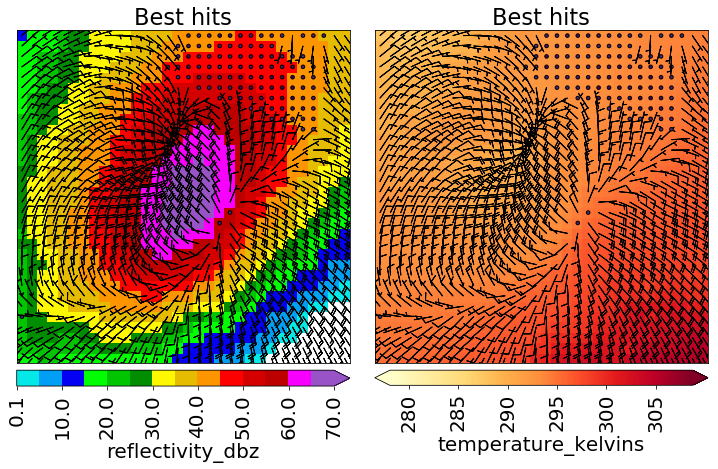

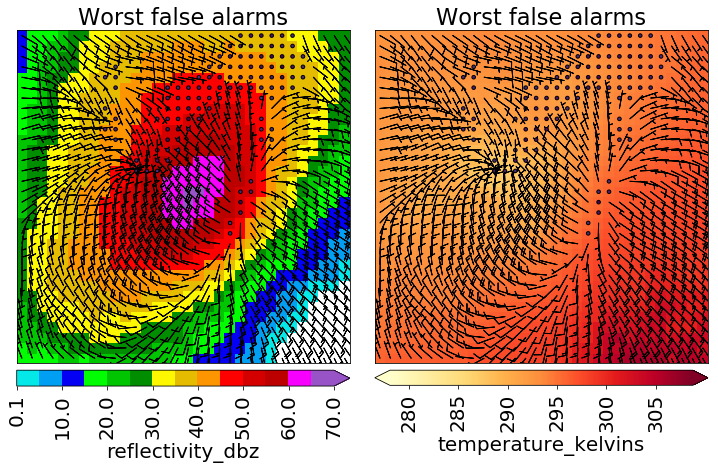

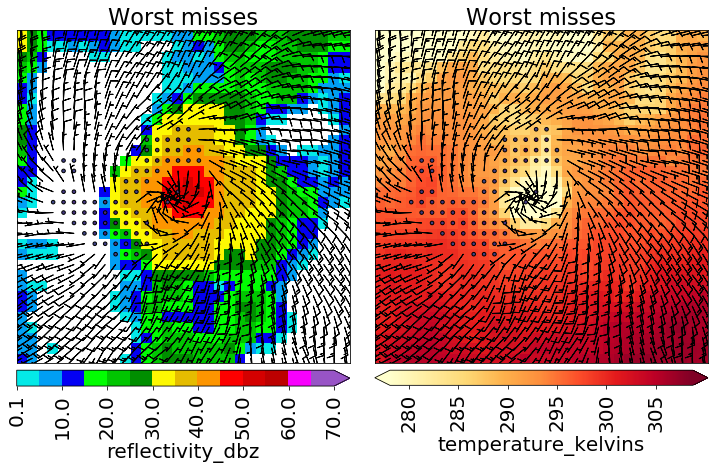

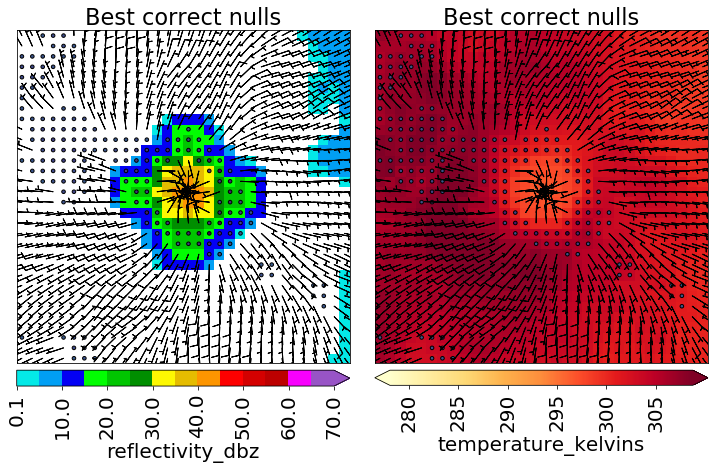

In [11]:
best_hits_matrix_denorm_pmm = extreme_example_dict_denorm_pmm[
    BEST_HIT_MATRIX_KEY
]
worst_fa_matrix_denorm_pmm = extreme_example_dict_denorm_pmm[
    WORST_FALSE_ALARM_MATRIX_KEY
]
worst_misses_matrix_denorm_pmm = extreme_example_dict_denorm_pmm[
    WORST_MISS_MATRIX_KEY
]
best_nulls_matrix_denorm_pmm = extreme_example_dict_denorm_pmm[
    BEST_CORRECT_NULLS_MATRIX_KEY
]
predictor_names = extreme_example_dict_denorm_pmm[PREDICTOR_NAMES_KEY]

concat_predictor_matrix = numpy.stack((
    best_hits_matrix_denorm_pmm, worst_fa_matrix_denorm_pmm,
    worst_misses_matrix_denorm_pmm, best_nulls_matrix_denorm_pmm,
), axis=0)

temperature_matrix_kelvins = concat_predictor_matrix[
    ..., predictor_names.index(utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_with_barbs(
        predictor_matrix=best_hits_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins)
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Best hits')

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_with_barbs(
        predictor_matrix=worst_fa_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins)
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Worst false alarms')

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_with_barbs(
        predictor_matrix=worst_misses_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins)
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Worst misses')

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_with_barbs(
        predictor_matrix=best_nulls_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins)
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Best correct nulls')

# <font color='red'>Read pre-trained upconvnet (required)</font>

The next cell reads a pre-trained upconvnet (upconvolutional network).  You will need this for novelty detection, the last interpretation method.  You will learn about upconvnets later, but basically, they project from the feature space created by a CNN back to image space.

Please note that the pre-trained upconvnet goes with the pre-trained CNN.  If you use the same upconvnet with another CNN, they will probably not "dance" together, meaning that novelty detection will give nonsense results.  Thus, even if you train your own CNN and use it to run all the other interpretation methods, you should use the two pre-trained models for novelty detection.

In [12]:
upconvnet_file_name = './pretrained_cnn/pretrained_ucn.h5'
upconvnet_model_object = cnn.read_model(upconvnet_file_name)

# Plot predictors for random storm object

The remaining code cells are **not required**.  In other words, you can run them in any order you want.

The next cell plots predictors ($u$-wind, $v$-wind, reflectivity, and temperature) for the first storm object in the validation data.

Wind is plotted here with barbs.  If you are new to meteorology and don't know how to read wind barbs, the picture below explains.  Basically, more appendages = higher wind speed and appendages point in the direction the wind is coming from.

<img src="wind_barb_explainer.png" alt="Wind-barb-explainer" width="500" />

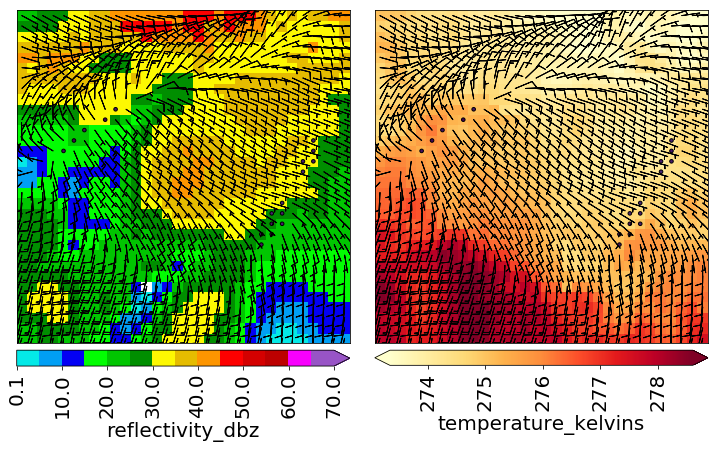

In [14]:
predictor_matrix = validation_image_dict[utils.PREDICTOR_MATRIX_KEY][0, ...]
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

temperature_matrix_kelvins = predictor_matrix[
    ..., predictor_names.index(utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

plotting.plot_many_predictors_with_barbs(
    predictor_matrix=predictor_matrix, predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

pyplot.show()

# Plot predictors for extreme storm object

The next cell plots predictors for the storm object with strongest future rotation in the validation data (it looks like it already has strong rotation).

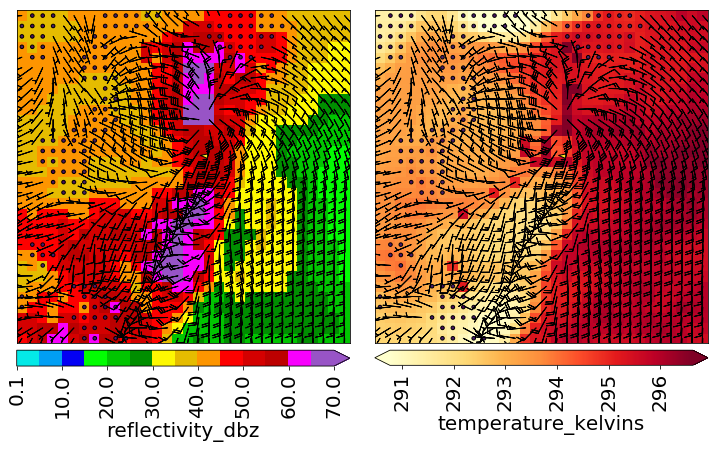

In [15]:
target_matrix_s01 = validation_image_dict[utils.TARGET_MATRIX_KEY]
example_index = numpy.unravel_index(
    numpy.argmax(target_matrix_s01), target_matrix_s01.shape
)[0]

predictor_matrix = validation_image_dict[utils.PREDICTOR_MATRIX_KEY][
    example_index, ...
]
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

temperature_matrix_kelvins = predictor_matrix[
    ..., predictor_names.index(utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

plotting.plot_many_predictors_with_barbs(
    predictor_matrix=predictor_matrix, predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

pyplot.show()

# Plot predictors without wind barbs

The next cell plots the same data but without wind barbs.  It plots the $u$-wind and $v$-wind fields separately.

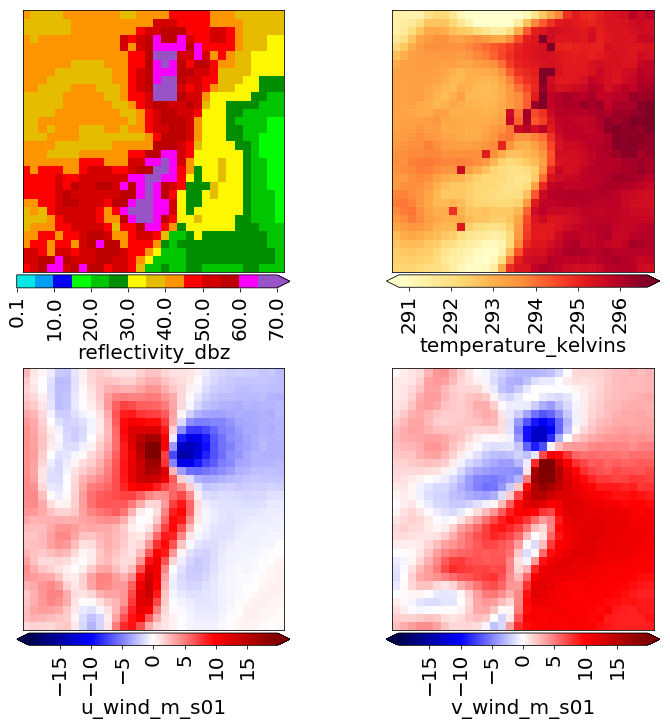

In [16]:
target_matrix_s01 = validation_image_dict[utils.TARGET_MATRIX_KEY]
example_index = numpy.unravel_index(
    numpy.argmax(target_matrix_s01), target_matrix_s01.shape
)[0]

predictor_matrix = validation_image_dict[utils.PREDICTOR_MATRIX_KEY][
    example_index, ...
]
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

temperature_matrix_kelvins = predictor_matrix[
    ..., predictor_names.index(utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_speed_matrix_m_s01 = numpy.sqrt(
    predictor_matrix[..., predictor_names.index(utils.U_WIND_NAME)] ** 2 +
    predictor_matrix[..., predictor_names.index(utils.V_WIND_NAME)] ** 2
)
max_speed_m_s01 = numpy.percentile(
    numpy.absolute(wind_speed_matrix_m_s01), 99
)

plotting.plot_many_predictors_sans_barbs(
    predictor_matrix=predictor_matrix, predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins,
    max_colour_wind_speed_m_s01=max_speed_m_s01
)

pyplot.show()

# Setting up a CNN (optional)

At this point all code cells are optional, but this one is marked "optional" to emphasize that you really don't need to do it.  It's not part of the lesson on model interpretation.

If you're taking the course in order, you probably already know how to set up a CNN (create the architecture).  However, you might want to play with the next few code cells if (a) you're not taking the course in order, (b) you want a refresher, or (c) you just want to train your own model for fun.

The first cell below defines a method called `_get_dense_layer_dimensions`, which sets up the dense layers to have an exponentially decreasing number of neurons.  I have found that this leads to good model performance and computationally efficiency.  The dense layers often contain the majority of weights in a CNN, and if you decrease the number of neurons too slowly, you might end up with a huge number of weights, causing the training time to skyrocket (and probably causing the model to overfit as well).

The second cell below sets up a CNN.  It contains a bunch of "constants" at the top, which you can tweak as you like.  The original constants are those used in the pre-trained CNN:

 - 2 convolutional blocks
 - 2 conv layers per block
 - 32 filters in first conv layer (doubling with each successive conv layer)
 - 3-by-3 convolution filter
 - No L$_1$ regularization
 - L$_2$ regularization in conv layers with a weight of 0.001
 - 3 dense layers
 - Dropout in dense layers with a dropout rate of 0.5.  However, dropout is not used for the final dense layer (the output layer).  I have found that this causes performance to seriously degrade.
 - Activation function is leaky ReLU with slope of 0.2.

In [17]:
def _get_dense_layer_dimensions(num_input_neurons, num_classes,
                                num_dense_layers):
    """Returns dimensions (num input and output neurons) for each dense layer.

    D = number of dense layers

    :param num_input_neurons: Number of input neurons (features created by
        flattening layer).
    :param num_classes: Number of output classes (possible values of target
        variable).
    :param num_dense_layers: Number of dense layers.
    :return: num_inputs_by_layer: length-D numpy array with number of input
        neurons by dense layer.
    :return: num_outputs_by_layer: length-D numpy array with number of output
        neurons by dense layer.
    """

    if num_classes == 2:
        num_output_neurons = 1
    else:
        num_output_neurons = num_classes + 0

    e_folding_param = (
        -1.0 * num_dense_layers /
        numpy.log(float(num_output_neurons) / num_input_neurons)
    )

    dense_layer_indices = numpy.linspace(
        0, num_dense_layers - 1, num=num_dense_layers, dtype=float
    )
    num_inputs_by_layer = num_input_neurons * numpy.exp(
        -dense_layer_indices / e_folding_param
    )
    num_inputs_by_layer = numpy.round(num_inputs_by_layer).astype(int)

    num_outputs_by_layer = numpy.concatenate((
        num_inputs_by_layer[1:],
        numpy.array([num_output_neurons], dtype=int)
    ))

    return num_inputs_by_layer, num_outputs_by_layer

In [20]:
# Feel free to play with these constants!

NUM_CONV_BLOCKS = 2
NUM_LAYERS_PER_BLOCK = 2
FIRST_NUM_CONV_FILTERS = 32
NUM_CONV_FILTER_ROWS = 3
NUM_CONV_FILTER_COLUMNS = 3

L1_WEIGHT = 0.
L2_WEIGHT = 0.001
NUM_DENSE_LAYERS = 3
DENSE_LAYER_DROPOUT_FRACTION = 0.5
SLOPE_FOR_RELU = 0.2

regularizer_object = keras.regularizers.l1_l2(l1=L1_WEIGHT, l2=L2_WEIGHT)

# Find grid dimensions and number of channels.
image_dict = utils.read_image_file(training_file_names[0])
predictor_matrix = image_dict[utils.PREDICTOR_MATRIX_KEY]
num_grid_rows = predictor_matrix.shape[1]
num_grid_columns = predictor_matrix.shape[2]
num_channels = predictor_matrix.shape[3]

# Create input layer.
input_layer_object = keras.layers.Input(
    shape=(num_grid_rows, num_grid_columns, num_channels)
)

# Add convolutional and pooling layers, with activation and batch
# normalization after each conv layer.
current_num_filters = None
current_layer_object = None

for _ in range(NUM_CONV_BLOCKS):
    for _ in range(NUM_LAYERS_PER_BLOCK):
        if current_num_filters is None:
            current_num_filters = FIRST_NUM_CONV_FILTERS + 0
            current_layer_object = input_layer_object
        else:
            current_num_filters *= 2

        current_layer_object = keras.layers.Conv2D(
            filters=current_num_filters,
            kernel_size=(NUM_CONV_FILTER_ROWS, NUM_CONV_FILTER_COLUMNS),
            strides=(1, 1), padding='valid', data_format='channels_last',
            dilation_rate=(1, 1), activation=None, use_bias=True,
            kernel_initializer='glorot_uniform', bias_initializer='zeros',
            kernel_regularizer=regularizer_object
        )(current_layer_object)

        current_layer_object = keras.layers.LeakyReLU(
            alpha=SLOPE_FOR_RELU
        )(current_layer_object)

        current_layer_object = keras.layers.BatchNormalization(
            axis=-1, center=True, scale=True
        )(current_layer_object)

    current_layer_object = keras.layers.MaxPooling2D(
        pool_size=(2, 2), strides=(2, 2),
        padding='valid', data_format='channels_last'
    )(current_layer_object)

these_dimensions = numpy.array(
    current_layer_object.get_shape().as_list()[1:], dtype=int
)
num_scalar_features = numpy.prod(these_dimensions)

current_layer_object = keras.layers.Flatten()(current_layer_object)

# Add non-final dense layers.
_, num_outputs_by_dense_layer = _get_dense_layer_dimensions(
    num_input_neurons=num_scalar_features, num_classes=2,
    num_dense_layers=NUM_DENSE_LAYERS
)

for k in range(NUM_DENSE_LAYERS - 1):
    current_layer_object = keras.layers.Dense(
        num_outputs_by_dense_layer[k], activation=None, use_bias=True,
        kernel_initializer='glorot_uniform', bias_initializer='zeros'
    )(current_layer_object)

    current_layer_object = keras.layers.LeakyReLU(
        alpha=SLOPE_FOR_RELU
    )(current_layer_object)

    current_layer_object = keras.layers.Dropout(
        rate=DENSE_LAYER_DROPOUT_FRACTION
    )(current_layer_object)

    current_layer_object = keras.layers.BatchNormalization(
        axis=-1, center=True, scale=True
    )(current_layer_object)

# Add final dense layer (output layer).
current_layer_object = keras.layers.Dense(
    1, activation=None, use_bias=True,
    kernel_initializer='glorot_uniform', bias_initializer='zeros',
)(current_layer_object)

current_layer_object = keras.layers.Activation(
    'sigmoid'
)(current_layer_object)

if NUM_DENSE_LAYERS == 1:
    current_layer_object = keras.layers.Dropout(
        rate=DENSE_LAYER_DROPOUT_FRACTION
    )(current_layer_object)

# Compile model.
custom_cnn_model_object = keras.models.Model(
    inputs=input_layer_object, outputs=current_layer_object
)
custom_cnn_model_object.compile(
    loss=keras.losses.binary_crossentropy,
    optimizer=keras.optimizers.Adam(),
    metrics=cnn.LIST_OF_METRIC_FUNCTIONS
)
custom_cnn_model_object.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 32, 32, 4)         0         
_________________________________________________________________
conv2d_5 (Conv2D)            (None, 30, 30, 32)        1184      
_________________________________________________________________
leaky_re_lu_7 (LeakyReLU)    (None, 30, 30, 32)        0         
_________________________________________________________________
batch_normalization_7 (Batch (None, 30, 30, 32)        128       
_________________________________________________________________
conv2d_6 (Conv2D)            (None, 28, 28, 64)        18496     
_________________________________________________________________
leaky_re_lu_8 (LeakyReLU)    (None, 28, 28, 64)        0         
_________________________________________________________________
batch_normalization_8 (Batch (None, 28, 28, 64)        256       
__________

# Training a CNN (optional)

Again, this part of the notebook is highly optional.

The first cell below defines a method called `train_cnn`, which (not surprisingly) trains a CNN.  The first input is `model_object`, which should be an untrained CNN like the one created above.  The CNN is trained with a generator, which reads small batches of data "on the fly".  The alternative is reading all the training data into memory at once, which is infeasible for large datasets.  (For this dataset it would be fine on most desktop computers, but generators are a good thing to know about.)

The second cell below actually trains the CNN.  If you are confident in your computing power, you can uncomment the first chunk of code, which trains a CNN for 100 epochs with 32 training batches per epoch, 16 validation batches per epoch, and 1024 examples per batch.

If you have a less capable computer (or just want to train a model quickly), you can leave the second chunk uncommented.  This trains a CNN for 10 epochs with 10 training batches per epoch, 10 validation batches per epoch, and 256 examples per batch.

In this case, validation data are used to "monitor" the CNN after each epoch.  Note the three "callback objects" in `train_cnn`.  `checkpoint_object` saves the new model weights only if validation loss has decreased from previous epochs; `plateau_object` decreases the learning rate if a new minimum validation loss has not been reached in a while; and `early_stopping_object` stops training altogether if it has been a *really* long time since the minimum validation loss.  All these measures prevent overfitting, which is a big problem generally in machine learning, but especially in meteorology, where we often have messy data.

In [19]:
def train_cnn(
        model_object, training_file_names, validation_file_names,
        num_examples_per_batch, normalization_dict, binarization_threshold,
        num_epochs, num_training_batches_per_epoch,
        num_validation_batches_per_epoch, output_file_name):
    """Trains CNN.

    :param model_object: Untrained model (instance of `keras.models.Model` or
        `keras.models.Sequential`).
    :param training_file_names: 1-D list of paths to training files (readable by
        `utils.read_image_file`).
    :param validation_file_names: Same but for validation files.
    :param num_examples_per_batch: See doc for `data_generator`.
    :param normalization_dict: Same.
    :param binarization_threshold: Same.
    :param num_epochs: Number of epochs.
    :param num_training_batches_per_epoch: Number of training batches per epoch.
    :param num_validation_batches_per_epoch: Number of validation batches per
        epoch.
    :param output_file_name: Path to output file.  The trained model will be
        saved here, after each epoch, as an HDF5 file.
    :return: cnn_metadata_dict: See doc for `write_metadata`.
    """

    utils.create_directory(file_name=output_file_name)

    cnn_metadata_dict = {
        cnn.TRAINING_FILES_KEY: training_file_names,
        cnn.NORMALIZATION_DICT_KEY: normalization_dict,
        cnn.BINARIZATION_THRESHOLD_KEY: binarization_threshold,
        cnn.NUM_EXAMPLES_PER_BATCH_KEY: num_examples_per_batch,
        cnn.NUM_TRAINING_BATCHES_KEY: num_training_batches_per_epoch,
        cnn.VALIDATION_FILES_KEY: validation_file_names,
        cnn.NUM_VALIDATION_BATCHES_KEY: num_validation_batches_per_epoch
    }

    checkpoint_object = keras.callbacks.ModelCheckpoint(
        filepath=output_file_name, monitor='val_loss',
        save_best_only=True, save_weights_only=False, mode='min', period=1,
        verbose=1
    )
    early_stopping_object = keras.callbacks.EarlyStopping(
        monitor='val_loss', min_delta=cnn.CROSS_ENTROPY_PATIENCE,
        patience=cnn.EARLY_STOPPING_PATIENCE_EPOCHS, mode='min', verbose=1
    )
    plateau_object = keras.callbacks.ReduceLROnPlateau(
        monitor='val_loss', factor=cnn.PLATEAU_LEARNING_RATE_MULTIPLIER,
        patience=cnn.PLATEAU_PATIENCE_EPOCHS, mode='min',
        min_delta=cnn.CROSS_ENTROPY_PATIENCE,
        cooldown=cnn.PLATEAU_COOLDOWN_EPOCHS,
        verbose=1
    )

    list_of_callback_objects = [
        checkpoint_object, early_stopping_object, plateau_object
    ]

    training_generator = cnn.data_generator(
        image_file_names=training_file_names,
        num_examples_per_batch=num_examples_per_batch,
        normalization_dict=normalization_dict,
        binarization_threshold=binarization_threshold
    )

    validation_generator = cnn.data_generator(
        image_file_names=validation_file_names,
        num_examples_per_batch=num_examples_per_batch,
        normalization_dict=normalization_dict,
        binarization_threshold=binarization_threshold
    )

    model_object.fit_generator(
        generator=training_generator,
        steps_per_epoch=num_training_batches_per_epoch, epochs=num_epochs,
        verbose=1, callbacks=list_of_callback_objects, workers=0,
        validation_data=validation_generator,
        validation_steps=num_validation_batches_per_epoch
    )

    return cnn_metadata_dict

In [ ]:
output_file_name = '{0:s}/custom_cnn/model.h5'.format(IMAGE_DIR_NAME)

# train_cnn(
#     model_object=cnn_model_object,
#     training_file_names=training_file_names,
#     validation_file_names=validation_file_names,
#     normalization_dict=normalization_dict,
#     binarization_threshold=binarization_threshold,
#     num_training_batches_per_epoch=32,
#     num_validation_batches_per_epoch=16,
#     num_examples_per_batch=1024, num_epochs=100,
#     output_file_name=output_file_name
# )

train_cnn(
    model_object=custom_cnn_model_object,
    training_file_names=training_file_names,
    validation_file_names=validation_file_names,
    normalization_dict=normalization_dict,
    binarization_threshold=binarization_threshold,
    num_training_batches_per_epoch=10,
    num_validation_batches_per_epoch=10,
    num_examples_per_batch=256, num_epochs=10,
    output_file_name=output_file_name
)

Epoch 1/10
Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20130527-0000_d01_model_patches.nc"...
Fraction of examples in positive class: 0.1094
 1/10 [==>...........................] - ETA: 29s - loss: 1.1848 - accuracy: 0.0521 - binary_accuracy: 0.5032 - binary_csi: 0.0949 - binary_frequency_bias: 4.4941 - binary_pod: 0.4762 - binary_pofd: 0.4934 - binary_peirce_score: -0.0173 - binary_success_ratio: 0.1060 - binary_focn: 0.8873Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20110610-0000_d01_model_patches.nc"...
Fraction of examples in positive class: 0.0703
 2/10 [=====>........................] - ETA: 17s - loss: 1.2805 - accuracy: 0.0475 - binary_accuracy: 0.5171 - binary_csi: 0.0894 - binary_frequency_bias: 5.6922 - binary_pod: 0.5432 - binary_pofd: 0.4842 - binary_peirce_score: 0.0590 - binary_success_ratio: 0.0973 - binary_focn: 0.9171 Reading data from: "../data/track_data_ncar_ams_3km_nc_small/NCARSTORM_20140628-0000_d01_model_pa

# Interpretation method 1: Permutation test

 - Measures the overall importance of each predictor variable, averaged over all grid cells and examples.
 - The "importance" of predictor $x_j$ is determined by how much model performance declines when $x_j$ is permuted (when maps of $x_j$ are shuffled over all examples).
 - If performance declines significantly, $x_j$ is important.
 - If performance does not decline significantly, $x_j$ is either unimportant or highly correlated with other predictors.
 - Two versions of the test: single-pass (Breiman 2001) and multi-pass (Lakshmanan *et al.* 2015).

## Single-pass test (figure credit to Amy McGovern)

<img src="breiman_permutation.gif" alt="Breiman permutation" width="500" />

Repeat the following for each predictor $x_j$:

 1. Copy the validation set ($\mathbf{X}$) to a new variable, $\mathbf{X'}$.
 2. Permute spatial maps of $x_j$ over all examples in $\mathbf{X'}$.  Thus, each map is left spatially intact but assigned to a different examples.
 3. Pass $\mathbf{X'}$ through the trained model and record the new loss.

The most important predictor is the one that causes the greatest increase in loss.

## Multi-pass test (figure credit to Amy McGovern)

<img src="lak_permutation.gif" alt="Lakshmanan permutation" width="500" />

Let $U$ be the set of predictors that are not yet permuted.  At the beginning, $U$ contains all predictors.

 1. For each predictor $x_j$ still in $U$:<br />
    [a] Copy the validation set ($\mathbf{X}$) to a new variable, $\mathbf{X'}$.<br />
    [b] Permute spatial maps of $x_j$ over all examples in $\mathbf{X'}$.<br />
    [c] Pass $\mathbf{X'}$ through the trained model and record the new loss.
 2. Find the predictor whose permutation in step 1 leads to the highest loss.  This is the most important predictor remaining in $U$.  Call it $x^*$.
 3. Remove $x^*$ from $U$ and permanently permute $x^*$ in the validation set $\mathbf{X}$.
 4. Repeat steps 1-3 until all predictors are permuted.

# Run permutation test

The next cell runs both the single-pass and multi-pass permutation tests on the validation data.  If you have a fast computer or a few minutes to wait, feel free to uncomment the second-last code chunk, which will run the permutation test on all validation examples.  If you're in a rush, you can leave the code as is and use only 2000 validation examples.

The cost function (or "loss function") I use for the permutation test is negative AUC (area under the receiver-operating-characteristic curve or ROC curve).  I use negative AUC, instead of just AUC, because the permutation code assumes the cost function is negatively oriented (lower = better) but AUC is positively oriented.

Note that AUC ranges from $\left[ 0, 1 \right]$ and values $\gtrsim$ 0.9 are generally considered "excellent".

In [11]:
target_values = binarization.binarize_target_images(
    target_matrix=validation_image_dict[utils.TARGET_MATRIX_KEY],
    binarization_threshold=binarization_threshold
)
clean_predictor_matrix = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY] + 0.
)
clean_predictor_matrix, _ = normalization.normalize_images(
    predictor_matrix=clean_predictor_matrix,
    predictor_names=validation_image_dict[utils.PREDICTOR_NAMES_KEY],
    normalization_dict=normalization_dict
)

# permutation_result_dict = permutation.run_forward_test(
#     model_object=cnn_model_object,
#     clean_predictor_matrix=clean_predictor_matrix,
#     target_values=target_values,
#     predictor_names=validation_image_dict[utils.PREDICTOR_NAMES_KEY]
# )

permutation_result_dict = permutation.run_forward_test(
    model_object=cnn_model_object,
    clean_predictor_matrix=clean_predictor_matrix[:2000, ...],
    target_values=target_values[:2000],
    predictor_names=validation_image_dict[utils.PREDICTOR_NAMES_KEY]
)

/home/ryan.lagerquist/anaconda3/lib/python3.6/site-packages/ams_2020_ml_python_course-0.1-py3.6.egg/interpretation/permutation.py:414: FutureWarning: Conversion of the second argument of issubdtype from `int` to `np.signedinteger` is deprecated. In future, it will be treated as `np.int64 == np.dtype(int).type`.
  assert numpy.issubdtype(target_values.dtype, int)


Average cost = -0.8787


**************************************************


Permuting predictor "reflectivity_dbz" at step 1...
Average cost = -0.6858
Permuting predictor "temperature_kelvins" at step 1...
Average cost = -0.8587
Permuting predictor "u_wind_m_s01" at step 1...
Average cost = -0.8452
Permuting predictor "v_wind_m_s01" at step 1...
Average cost = -0.8420
Best predictor = "reflectivity_dbz" ... cost = -0.6858


**************************************************


Permuting predictor "temperature_kelvins" at step 2...
Average cost = -0.6146
Permuting predictor "u_wind_m_s01" at step 2...
Average cost = -0.6019
Permuting predictor "v_wind_m_s01" at step 2...
Average cost = -0.6139
Best predictor = "u_wind_m_s01" ... cost = -0.6019


**************************************************


Permuting predictor "temperature_kelvins" at step 3...
Average cost = -0.5482
Permuting predictor "v_wind_m_s01" at step 3...
Average cost = -0.5598
Best predictor = "temperature_kelvins" ...

# Plot results of permutation test

The next code cell plots results for both the single-pass and multi-pass permutation tests.  In both plots, importance decreases from top to bottom (the most important predictor is at the top).

Are there any differences between the two rankings?  Why or why not?

Text(0.5,1,'Multi-pass forward test')

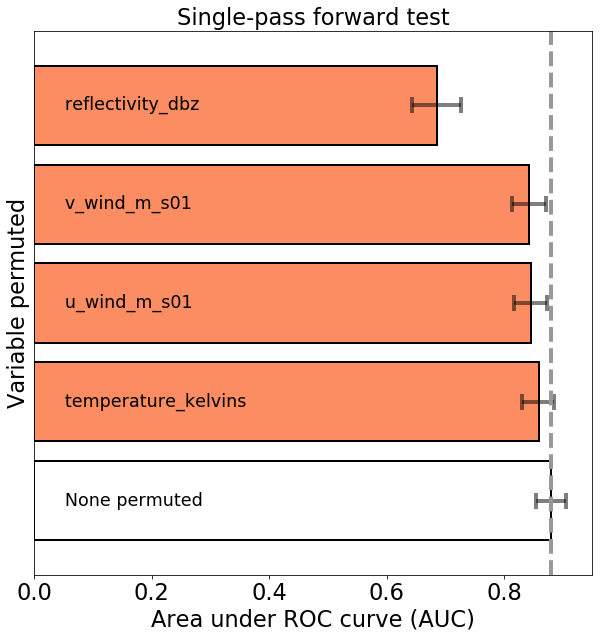

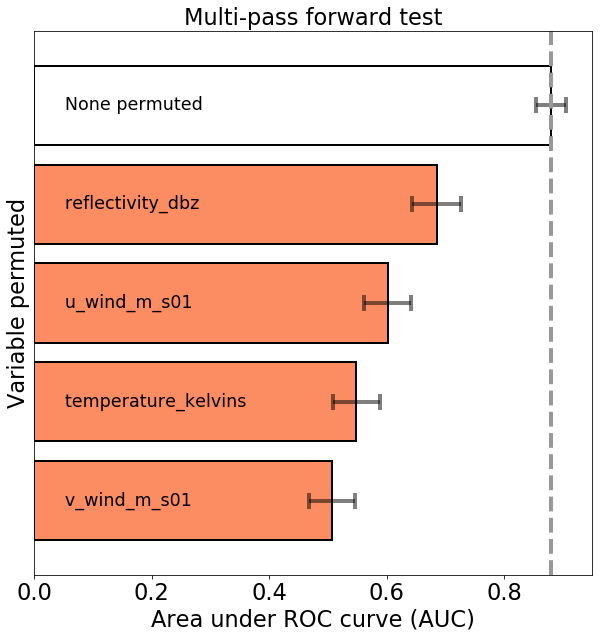

In [12]:
axes_object = permutation.plot_single_pass_test(
    result_dict=permutation_result_dict
)
axes_object.set_title('Single-pass forward test')

axes_object = permutation.plot_multipass_test(
    result_dict=permutation_result_dict
)
axes_object.set_title('Multi-pass forward test')

# Interpretation method 2: Saliency maps

Saliency (Simonyan *et al.* 2014) is defined by the following derivative:

$s = \frac{\partial a}{\partial x} \bigg \rvert_{x = x_0}$

 - $a$ is the activation of a neuron in the model
 - $x$ is a scalar predictor (one variable at one grid point)
 - $x_0$ is the value of $x$ in a real example

Thus, saliency is an approximation of $\frac{\partial a}{\partial x}$, linearized around the $x$-value that occurs in the example.  This can be computed for all scalar predictors $x$, resulting in a map.

$a$ is often the activation of an output neuron, which is a prediction.  In this notebook, there is only one output neuron and its activation is probability of strong future rotation.  Thus, our saliency maps quantify the sensitivity of strong-rotation probability to each input, answering the question "How could the storm be perturbed to increase/decrease the likelihood of strong future rotation?"

However, $a$ could also be of the following (figure from https://distill.pub/2018/building-blocks/):

 - Activation of inner neuron (in a convolutional or dense layer)
 - Mean/max activation of all neurons in a channel
 - Mean/max activation of all neurons in a layer
 - Mean/max activation of all neurons at one spatial location

<img src="model_components.png" alt="Model components" width="1000" />

# Example 1 for saliency

The next cell computes and plots the saliency map for the first example in the validation data.  To interpret the plot:

 - Remember that saliency is $\frac{\partial p}{\partial x}$, where $p$ is probability of strong future rotation and $x$ is a predictor.
 - Solid contours mean positive saliency ($p$ increases when $x$ increases).
 - Dashed contours mean positive saliency ($p$ decreases when $x$ increases).
 - Positive $u$-wind is westerly (towards the east or towards the right).
 - Positive $v$-wind is southerly (towards the north or towards the top).

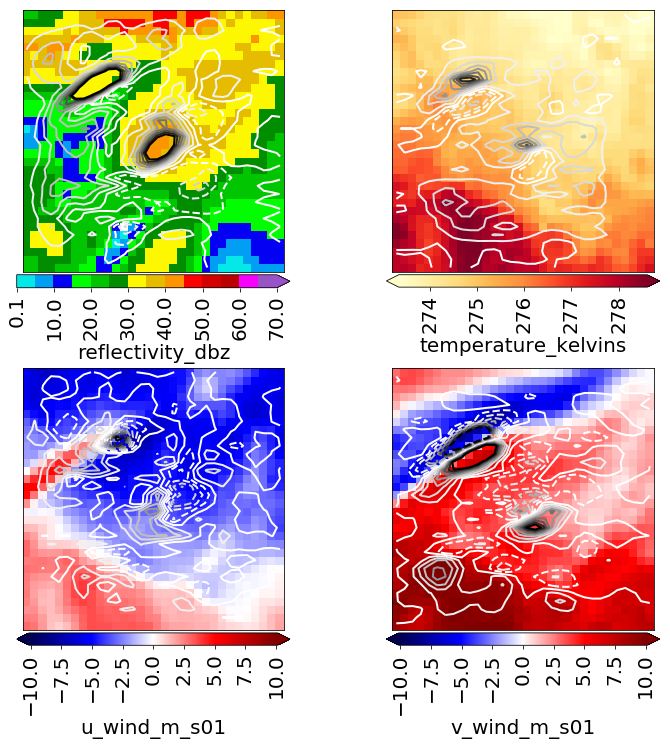

In [13]:
predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][0, ...] + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)
predictor_matrix_norm = numpy.expand_dims(predictor_matrix_norm, axis=0)

saliency_matrix = saliency.get_saliency_maps_for_class(
    model_object=cnn_model_object, target_class=1,
    list_of_input_matrices=[predictor_matrix_norm]
)[0][0, ...]

saliency_matrix = saliency.smooth_saliency_maps(
    saliency_matrices=[saliency_matrix], smoothing_radius_grid_cells=1
)[0]

temperature_matrix_kelvins = predictor_matrix_denorm[
    ..., predictor_names.index(utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(utils.U_WIND_NAME),
    predictor_names.index(utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(predictor_matrix_denorm[..., wind_indices]), 99
)

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=predictor_matrix_denorm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01)
)

max_contour_value = numpy.percentile(numpy.absolute(saliency_matrix), 99)

saliency.plot_saliency_maps(
    saliency_matrix_3d=saliency_matrix,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=max_contour_value,
    contour_interval=max_contour_value / 8
)

# Example 2 for saliency

The next cell computes and plots the saliency map for the most extreme validation example (that with the strongest future rotation).

/home/ryan.lagerquist/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1173: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


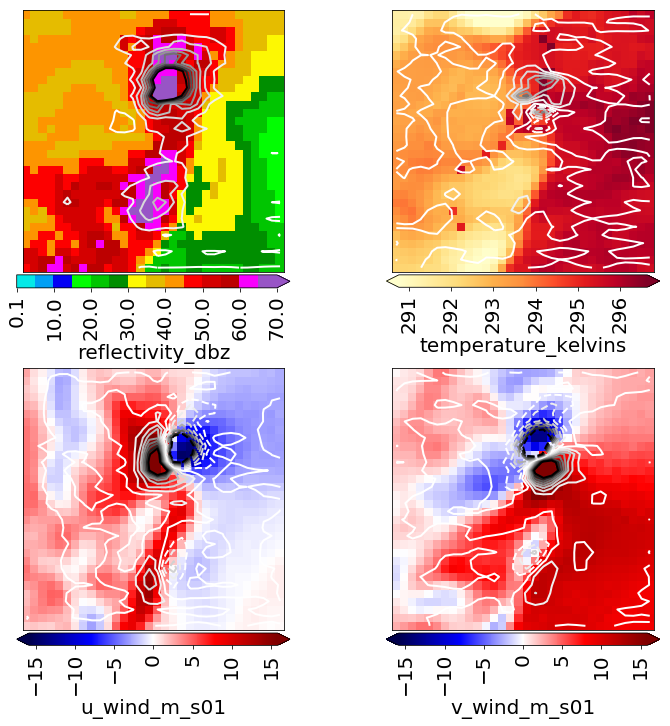

In [14]:
target_matrix_s01 = validation_image_dict[utils.TARGET_MATRIX_KEY]
example_index = numpy.unravel_index(
    numpy.argmax(target_matrix_s01), target_matrix_s01.shape
)[0]

predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][example_index, ...]
    + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)
predictor_matrix_norm = numpy.expand_dims(predictor_matrix_norm, axis=0)

saliency_matrix = saliency.get_saliency_maps_for_class(
    model_object=cnn_model_object, target_class=1,
    list_of_input_matrices=[predictor_matrix_norm]
)[0][0, ...]

saliency_matrix = saliency.smooth_saliency_maps(
    saliency_matrices=[saliency_matrix], smoothing_radius_grid_cells=1
)[0]

temperature_matrix_kelvins = predictor_matrix_denorm[
    ..., predictor_names.index(utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(utils.U_WIND_NAME),
    predictor_names.index(utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(predictor_matrix_denorm[..., wind_indices]), 99
)

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=predictor_matrix_denorm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01)
)

max_contour_value = numpy.percentile(numpy.absolute(saliency_matrix), 99)

saliency.plot_saliency_maps(
    saliency_matrix_3d=saliency_matrix,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=max_contour_value,
    contour_interval=max_contour_value / 8
)

# Example 3 for saliency

The next cell plots and computes the average (well, PMM composite) saliency map for each set of extreme cases.

/home/ryan.lagerquist/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1173: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


Text(0.5,0.98,'Saliency for best correct nulls')

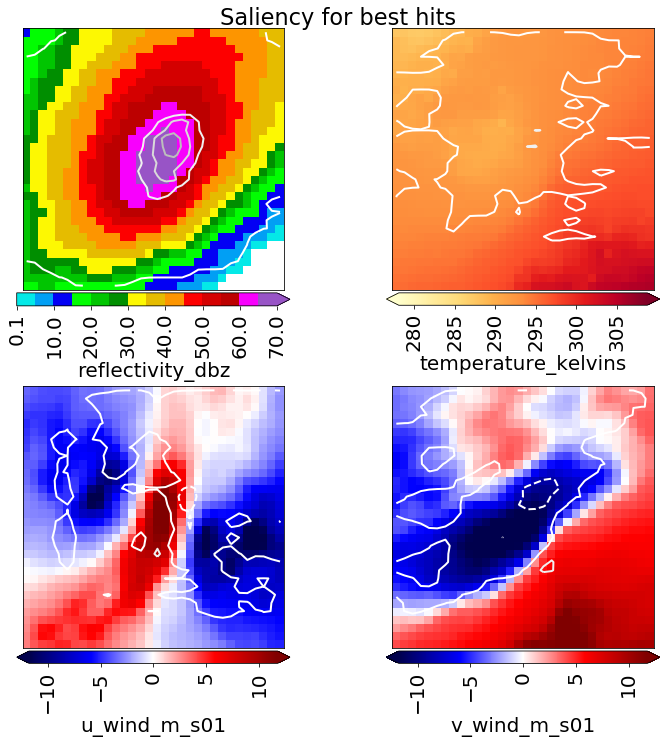

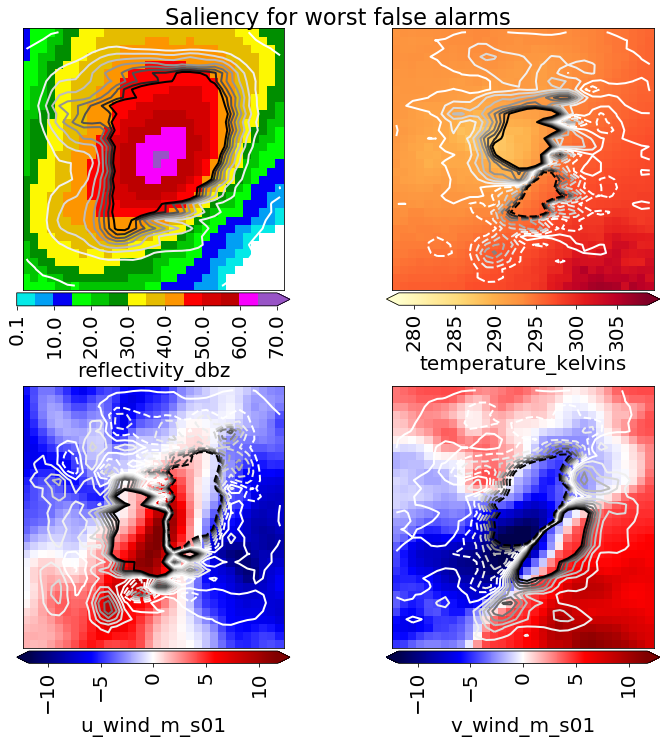

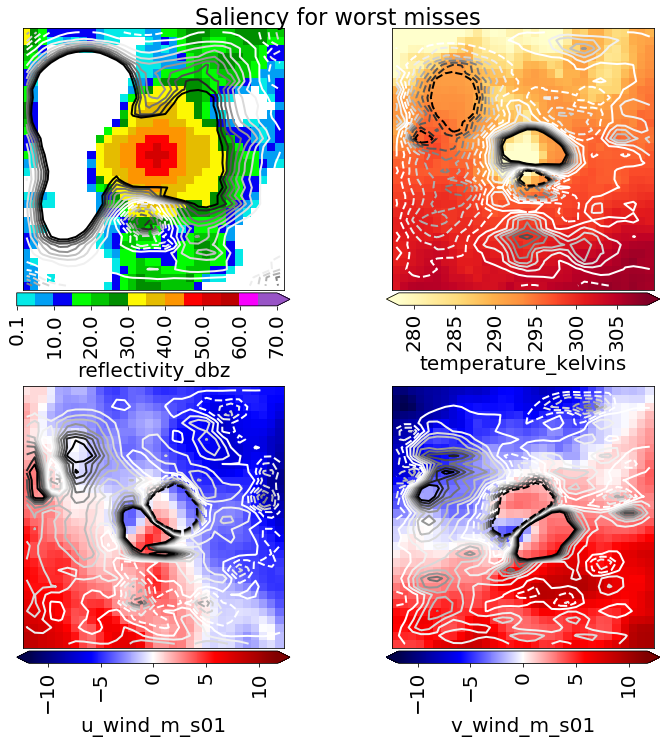

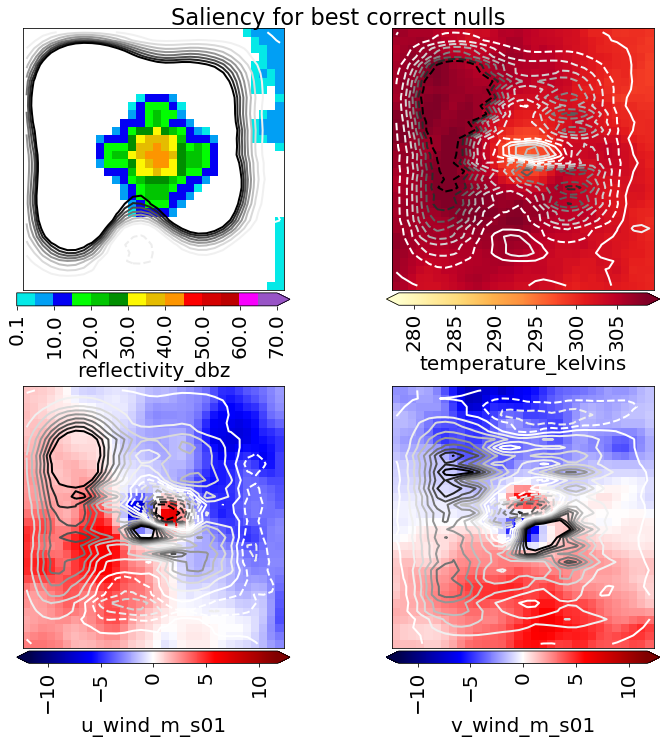

In [19]:
best_hits_saliency_matrix = saliency.get_saliency_maps_for_class(
    model_object=cnn_model_object, target_class=1,
    list_of_input_matrices=[extreme_example_dict_norm[BEST_HIT_MATRIX_KEY]]
)[0]
best_hits_saliency_matrix_pmm = utils.run_pmm_many_variables(
    field_matrix=best_hits_saliency_matrix
)
best_hits_saliency_matrix_pmm = saliency.smooth_saliency_maps(
    saliency_matrices=[best_hits_saliency_matrix_pmm],
    smoothing_radius_grid_cells=1
)[0]

worst_fa_saliency_matrix = saliency.get_saliency_maps_for_class(
    model_object=cnn_model_object, target_class=1,
    list_of_input_matrices=
    [extreme_example_dict_norm[WORST_FALSE_ALARM_MATRIX_KEY]]
)[0]
worst_fa_saliency_matrix_pmm = utils.run_pmm_many_variables(
    field_matrix=worst_fa_saliency_matrix
)
worst_fa_saliency_matrix_pmm = saliency.smooth_saliency_maps(
    saliency_matrices=[worst_fa_saliency_matrix_pmm],
    smoothing_radius_grid_cells=1
)[0]

worst_misses_saliency_matrix = saliency.get_saliency_maps_for_class(
    model_object=cnn_model_object, target_class=1,
    list_of_input_matrices=
    [extreme_example_dict_norm[WORST_MISS_MATRIX_KEY]]
)[0]
worst_misses_saliency_matrix_pmm = utils.run_pmm_many_variables(
    field_matrix=worst_misses_saliency_matrix
)
worst_misses_saliency_matrix_pmm = saliency.smooth_saliency_maps(
    saliency_matrices=[worst_misses_saliency_matrix_pmm],
    smoothing_radius_grid_cells=1
)[0]

best_nulls_saliency_matrix = saliency.get_saliency_maps_for_class(
    model_object=cnn_model_object, target_class=1,
    list_of_input_matrices=
    [extreme_example_dict_norm[BEST_CORRECT_NULLS_MATRIX_KEY]]
)[0]
best_nulls_saliency_matrix_pmm = utils.run_pmm_many_variables(
    field_matrix=best_nulls_saliency_matrix
)
best_nulls_saliency_matrix_pmm = saliency.smooth_saliency_maps(
    saliency_matrices=[best_nulls_saliency_matrix_pmm],
    smoothing_radius_grid_cells=1
)[0]

best_hits_matrix_denorm_pmm = extreme_example_dict_denorm_pmm[
    BEST_HIT_MATRIX_KEY
]
worst_fa_matrix_denorm_pmm = extreme_example_dict_denorm_pmm[
    WORST_FALSE_ALARM_MATRIX_KEY
]
worst_misses_matrix_denorm_pmm = extreme_example_dict_denorm_pmm[
    WORST_MISS_MATRIX_KEY
]
best_nulls_matrix_denorm_pmm = extreme_example_dict_denorm_pmm[
    BEST_CORRECT_NULLS_MATRIX_KEY
]
predictor_names = extreme_example_dict_denorm_pmm[PREDICTOR_NAMES_KEY]

concat_predictor_matrix = numpy.stack((
    best_hits_matrix_denorm_pmm, worst_fa_matrix_denorm_pmm,
    worst_misses_matrix_denorm_pmm, best_nulls_matrix_denorm_pmm,
), axis=0)

temperature_matrix_kelvins = concat_predictor_matrix[
    ..., predictor_names.index(utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(utils.U_WIND_NAME),
    predictor_names.index(utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(concat_predictor_matrix[..., wind_indices]), 99
)

concat_saliency_matrix = numpy.stack((
    best_hits_saliency_matrix_pmm, worst_fa_saliency_matrix_pmm,
    worst_misses_saliency_matrix_pmm, best_nulls_saliency_matrix_pmm,
), axis=0)

max_saliency = numpy.percentile(numpy.absolute(concat_saliency_matrix), 90)

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=best_hits_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01)
)

saliency.plot_saliency_maps(
    saliency_matrix_3d=best_hits_saliency_matrix_pmm,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=max_saliency,
    contour_interval=max_saliency / 8
)

figure_object.suptitle('Saliency for best hits')

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=worst_fa_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01)
)

saliency.plot_saliency_maps(
    saliency_matrix_3d=worst_fa_saliency_matrix_pmm,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=max_saliency,
    contour_interval=max_saliency / 8
)

figure_object.suptitle('Saliency for worst false alarms')

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=worst_misses_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01)
)

saliency.plot_saliency_maps(
    saliency_matrix_3d=worst_misses_saliency_matrix_pmm,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=max_saliency,
    contour_interval=max_saliency / 8
)

figure_object.suptitle('Saliency for worst misses')

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=best_nulls_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01)
)

saliency.plot_saliency_maps(
    saliency_matrix_3d=best_nulls_saliency_matrix_pmm,
    axes_object_matrix=axes_object_matrix,
    colour_map_object=pyplot.get_cmap('Greys'),
    max_contour_value=max_saliency,
    contour_interval=max_saliency / 8
)

figure_object.suptitle('Saliency for best correct nulls')

# Interpretation method 3: Class-activation maps (CAM)

Class activation (Zhou *et al.* 2016) is the amount of evidence for a given class, according to one convolutional layer.  We will look at the positive class (strong future rotation).

Key differences between saliency and class activation:

 1. Class activation is defined for each grid point; saliency is defined for each grid point and predictor variable.
   - Thus, class activation yields only one map, instead of one per predictor variable.<br />
 2. Class activation cannot be negative (it can be zero or positive).
   - Thus, in the framework of class activation, there is no such thing as negative evidence.  However, if you really want to look at a map with evidence of the negative class (weak future rotation), you can compute class activation for the negative class (class 0 instead of 1).<br />
 3. Class activation highlights the values most important for the model's actual prediction; saliency highlights the values most important for changing the model's prediction.<br />
 4. Class activation is different for each convolutional layer.
   - CAMs produced by deeper conv layers are generally smoother and have large values confined to a smaller part of the image.
   - This is because deeper layers contain larger-scale features and more abstraction.

We use a method called Grad-CAM (gradient-weighted class-activation maps; Selvaraju *et al.* 2017), because the original method (Zhou *et al.* 2016) works only for a particular CNN architecture, which we do not have.

# Example 1 for CAM

The next cell computes and plots the class-activation map for the most extreme validation example, with respect to all four convolutional layers.  To interpret the plots:

 - Darker contours mean higher class activation.
 - Absence of contours means zero class activation.
 - The same map is overlain on all predictor variables.

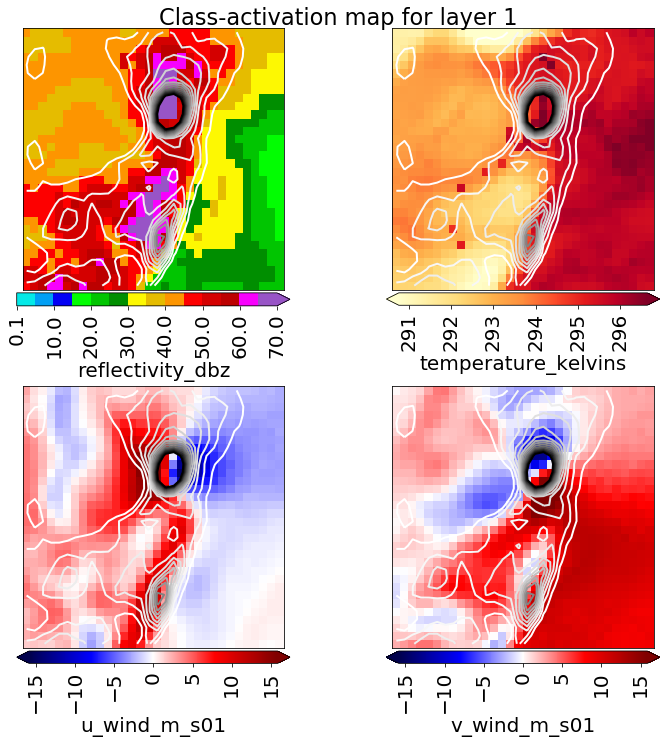

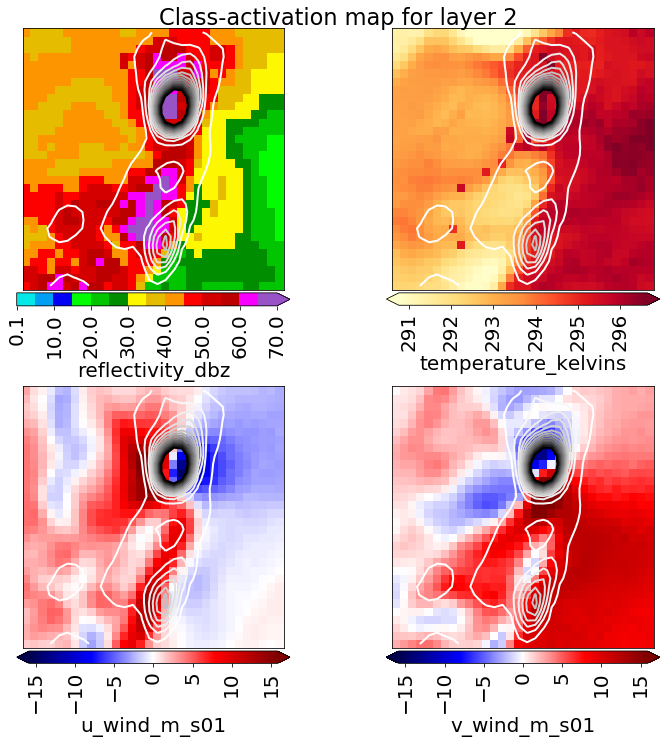

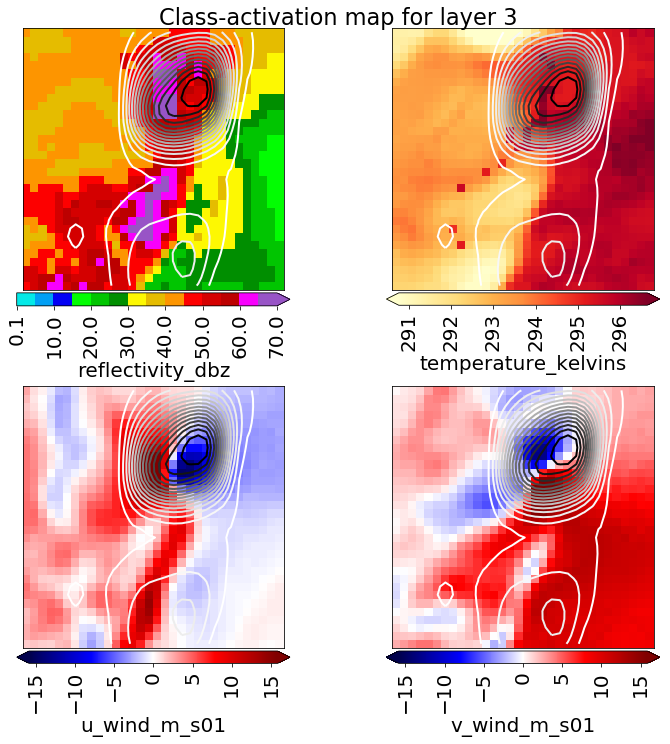

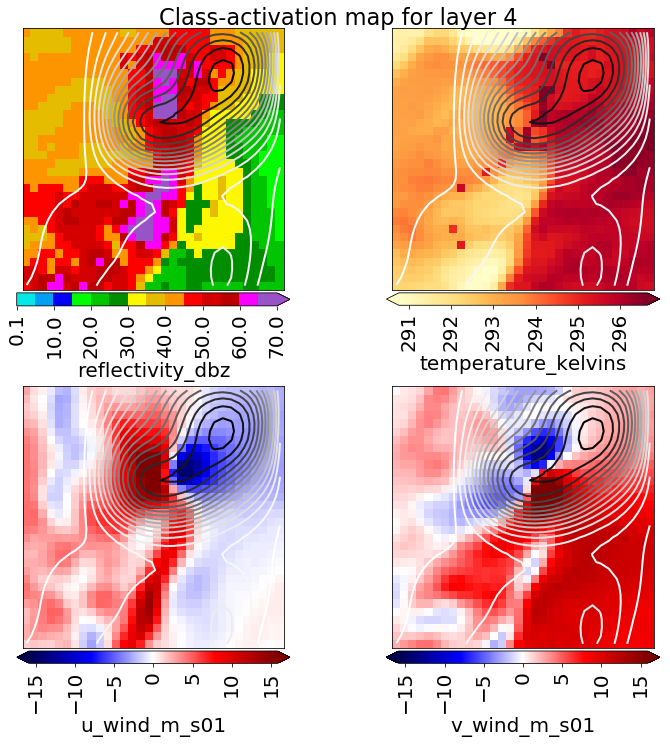

In [22]:
target_matrix_s01 = validation_image_dict[utils.TARGET_MATRIX_KEY]
example_index = numpy.unravel_index(
    numpy.argmax(target_matrix_s01), target_matrix_s01.shape
)[0]

predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][example_index, ...]
    + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)

temperature_matrix_kelvins = predictor_matrix_denorm[
    ..., predictor_names.index(utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(utils.U_WIND_NAME),
    predictor_names.index(utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(predictor_matrix_denorm[..., wind_indices]), 99
)

target_layer_names = [
    'batch_normalization_1', 'batch_normalization_2',
    'batch_normalization_3', 'batch_normalization_4'
]

for i in range(len(target_layer_names)):
    class_activation_matrix = class_activation.run_gradcam(
        model_object=cnn_model_object, input_matrix=predictor_matrix_norm,
        target_class=1, target_layer_name=target_layer_names[i]
    )

    figure_object, axes_object_matrix = (
        plotting.plot_many_predictors_sans_barbs(
            predictor_matrix=predictor_matrix_denorm,
            predictor_names=predictor_names,
            min_colour_temp_kelvins=min_temp_kelvins,
            max_colour_temp_kelvins=max_temp_kelvins,
            max_colour_wind_speed_m_s01=max_speed_m_s01)
    )

    max_contour_value = numpy.percentile(class_activation_matrix, 99)

    class_activation.plot_2d_cam(
        class_activation_matrix_2d=class_activation_matrix,
        axes_object_matrix=axes_object_matrix,
        num_channels=predictor_matrix_norm.shape[-1],
        colour_map_object=pyplot.get_cmap('Greys'),
        min_contour_value=max_contour_value / 15,
        max_contour_value=max_contour_value,
        contour_interval=max_contour_value / 15
    )

    figure_object.suptitle(
        'Class-activation map for layer {0:d}'.format(i + 1)
    )
    pyplot.show()

# Example 2 for CAM

The next cell computes and plots the class-activation map for the first validation example, with respect to all four convolutional layers.

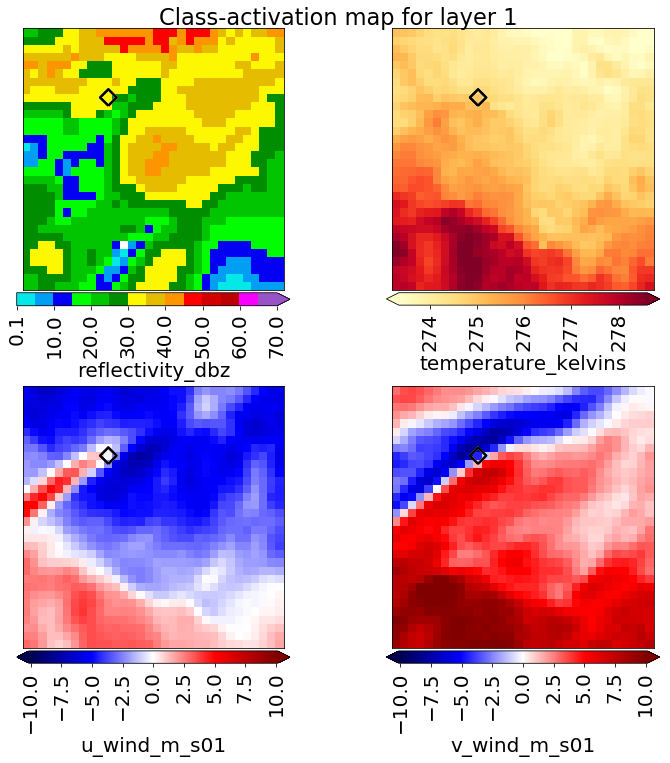

/home/ryan.lagerquist/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1173: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


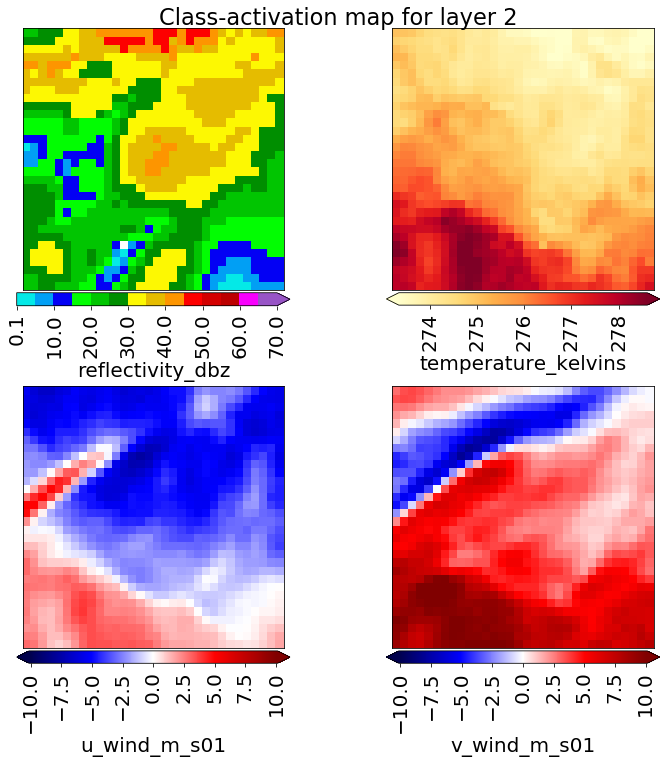

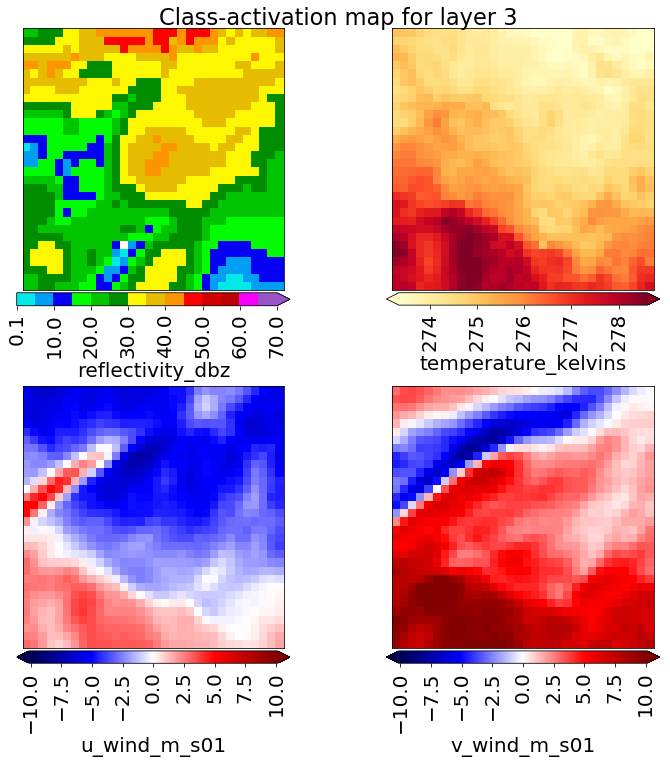

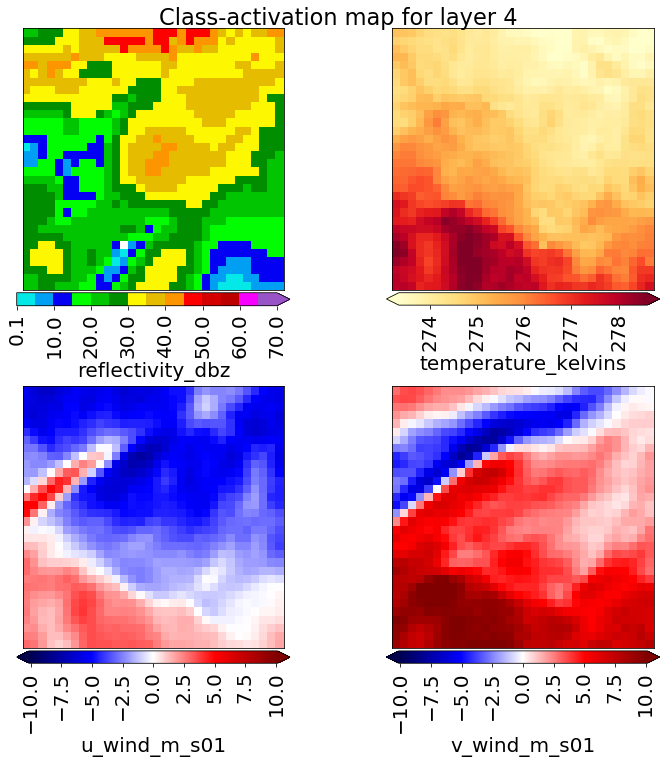

In [23]:
predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][0, ...] + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)

temperature_matrix_kelvins = predictor_matrix_denorm[
    ..., predictor_names.index(utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(utils.U_WIND_NAME),
    predictor_names.index(utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(predictor_matrix_denorm[..., wind_indices]), 99
)

target_layer_names = [
    'batch_normalization_1', 'batch_normalization_2',
    'batch_normalization_3', 'batch_normalization_4'
]

for i in range(len(target_layer_names)):
    class_activation_matrix = class_activation.run_gradcam(
        model_object=cnn_model_object, input_matrix=predictor_matrix_norm,
        target_class=1, target_layer_name=target_layer_names[i]
    )

    figure_object, axes_object_matrix = (
        plotting.plot_many_predictors_sans_barbs(
            predictor_matrix=predictor_matrix_denorm,
            predictor_names=predictor_names,
            min_colour_temp_kelvins=min_temp_kelvins,
            max_colour_temp_kelvins=max_temp_kelvins,
            max_colour_wind_speed_m_s01=max_speed_m_s01)
    )

    max_contour_value = numpy.percentile(class_activation_matrix, 99)

    class_activation.plot_2d_cam(
        class_activation_matrix_2d=class_activation_matrix,
        axes_object_matrix=axes_object_matrix,
        num_channels=predictor_matrix_norm.shape[-1],
        colour_map_object=pyplot.get_cmap('Greys'),
        min_contour_value=max_contour_value / 15,
        max_contour_value=max_contour_value,
        contour_interval=max_contour_value / 15
    )

    figure_object.suptitle(
        'Class-activation map for layer {0:d}'.format(i + 1)
    )
    pyplot.show()

# Example 3 for CAM

The next cell plots and computes the average (well, PMM composite) class-activation map for each set of extreme cases, according to the third convolution layer.

If you have plenty of time or a fast computer, feel free to uncomment the first command, which will create CAMs for all 100 examples in each set.  If not, you can leave the code "as is" and use only the first 25 examples in each set.

Have computed CAM for 0 of 100 extreme examples...
Have computed CAM for 4 of 100 extreme examples...
Have computed CAM for 8 of 100 extreme examples...
Have computed CAM for 12 of 100 extreme examples...
Have computed CAM for 16 of 100 extreme examples...
Have computed CAM for 20 of 100 extreme examples...
Have computed CAM for 24 of 100 extreme examples...
Have computed CAM for 28 of 100 extreme examples...
Have computed CAM for 32 of 100 extreme examples...
Have computed CAM for 36 of 100 extreme examples...
Have computed CAM for 40 of 100 extreme examples...
Have computed CAM for 44 of 100 extreme examples...
Have computed CAM for 48 of 100 extreme examples...
Have computed CAM for 52 of 100 extreme examples...
Have computed CAM for 56 of 100 extreme examples...
Have computed CAM for 60 of 100 extreme examples...
Have computed CAM for 64 of 100 extreme examples...
Have computed CAM for 68 of 100 extreme examples...
Have computed CAM for 72 of 100 extreme examples...
Have computed C

/home/ryan.lagerquist/anaconda3/lib/python3.6/site-packages/matplotlib/contour.py:1173: UserWarning: No contour levels were found within the data range.
  warnings.warn("No contour levels were found"


Text(0.5,0.98,'Class activation for best correct nulls')

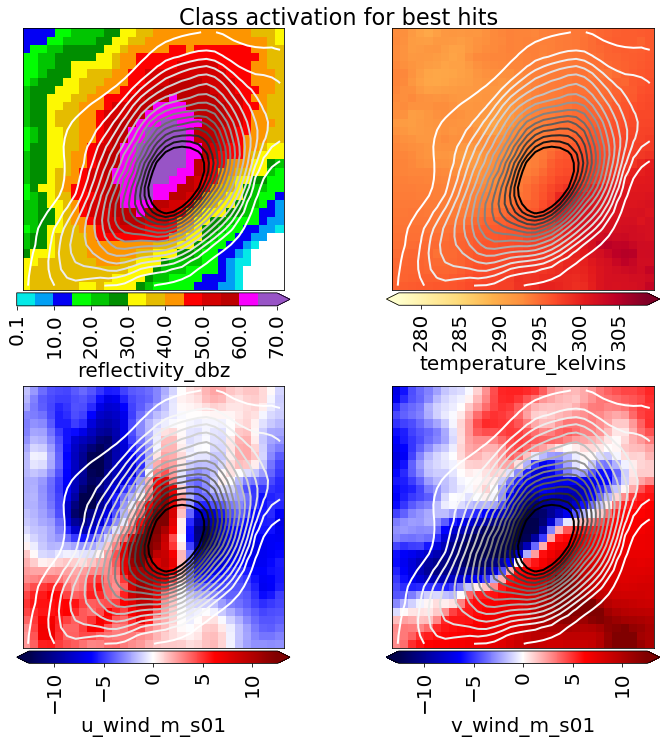

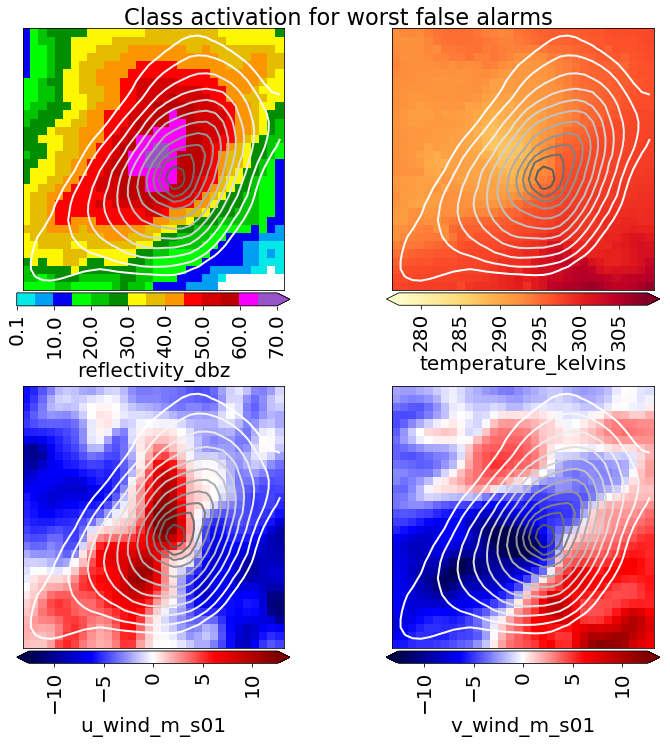

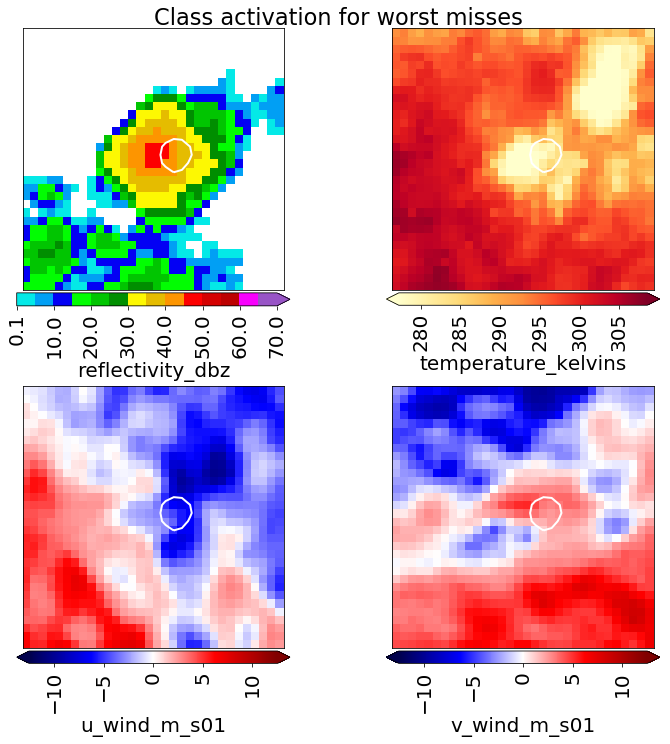

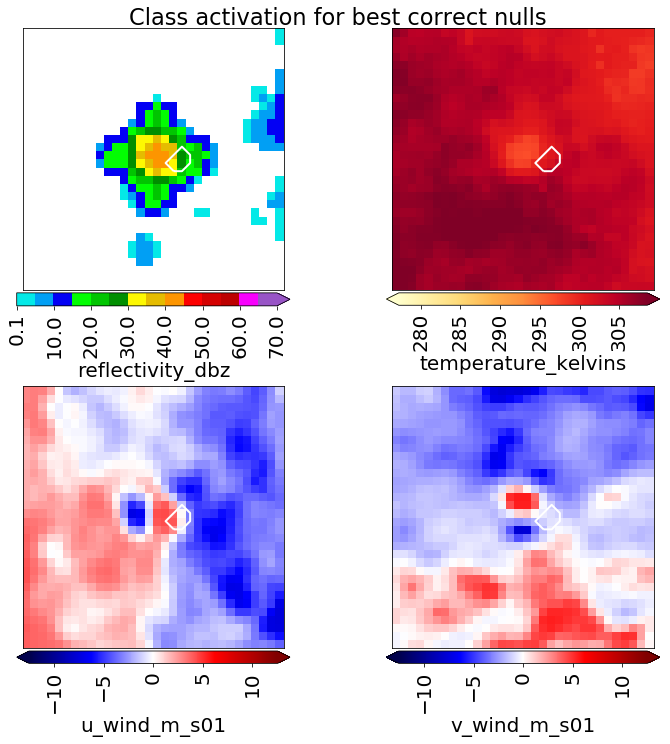

In [25]:
# num_examples_per_set = (
#     extreme_example_dict_norm[BEST_HIT_MATRIX_KEY].shape[0]
# )
num_examples_per_set = 25

best_hits_matrix_denorm = extreme_example_dict_denorm[
    BEST_HIT_MATRIX_KEY
][:num_examples_per_set, ...]

worst_fa_matrix_denorm = extreme_example_dict_denorm[
    WORST_FALSE_ALARM_MATRIX_KEY
][:num_examples_per_set, ...]

worst_misses_matrix_denorm = extreme_example_dict_denorm[
    WORST_MISS_MATRIX_KEY
][:num_examples_per_set, ...]

best_nulls_matrix_denorm = extreme_example_dict_denorm[
    BEST_CORRECT_NULLS_MATRIX_KEY
][:num_examples_per_set, ...]

best_hits_matrix_denorm_pmm = utils.run_pmm_many_variables(
    field_matrix=best_hits_matrix_denorm
)
worst_fa_matrix_denorm_pmm = utils.run_pmm_many_variables(
    field_matrix=worst_fa_matrix_denorm
)
worst_misses_matrix_denorm_pmm = utils.run_pmm_many_variables(
    field_matrix=worst_misses_matrix_denorm
)
best_nulls_matrix_denorm_pmm = utils.run_pmm_many_variables(
    field_matrix=best_nulls_matrix_denorm
)

these_dim = best_hits_matrix_denorm.shape[:-1]
best_hits_activn_matrix = numpy.full(these_dim, numpy.nan)
worst_fa_activn_matrix = numpy.full(these_dim, numpy.nan)
worst_misses_activn_matrix = numpy.full(these_dim, numpy.nan)
best_nulls_activn_matrix = numpy.full(these_dim, numpy.nan)

for i in range(num_examples_per_set):
    print('Have computed CAM for {0:d} of {1:d} extreme examples...'.format(
        4 * i, 4 * num_examples_per_set
    ))

    best_hits_activn_matrix[i, ...] = class_activation.run_gradcam(
        model_object=cnn_model_object,
        input_matrix=extreme_example_dict_norm[BEST_HIT_MATRIX_KEY][i, ...],
        target_class=1, target_layer_name='batch_normalization_3'
    )

    worst_fa_activn_matrix[i, ...] = class_activation.run_gradcam(
        model_object=cnn_model_object,
        input_matrix=
        extreme_example_dict_norm[WORST_FALSE_ALARM_MATRIX_KEY][i, ...],
        target_class=1, target_layer_name='batch_normalization_3'
    )

    worst_misses_activn_matrix[i, ...] = class_activation.run_gradcam(
        model_object=cnn_model_object,
        input_matrix=
        extreme_example_dict_norm[WORST_MISS_MATRIX_KEY][i, ...],
        target_class=1, target_layer_name='batch_normalization_3'
    )

    best_nulls_activn_matrix[i, ...] = class_activation.run_gradcam(
        model_object=cnn_model_object,
        input_matrix=
        extreme_example_dict_norm[BEST_CORRECT_NULLS_MATRIX_KEY][i, ...],
        target_class=1, target_layer_name='batch_normalization_3'
    )

print('Have computed CAM for all {0:d} extreme examples!'.format(
    4 * num_examples_per_set
))

best_hits_activn_matrix_pmm = utils.run_pmm_one_variable(
    field_matrix=best_hits_activn_matrix
)
worst_fa_activn_matrix_pmm = utils.run_pmm_one_variable(
    field_matrix=worst_fa_activn_matrix
)
worst_misses_activn_matrix_pmm = utils.run_pmm_one_variable(
    field_matrix=worst_misses_activn_matrix
)
best_nulls_activn_matrix_pmm = utils.run_pmm_one_variable(
    field_matrix=best_nulls_activn_matrix
)

concat_predictor_matrix = numpy.stack((
    best_hits_matrix_denorm_pmm, worst_fa_matrix_denorm_pmm,
    worst_misses_matrix_denorm_pmm, best_nulls_matrix_denorm_pmm,
), axis=0)

predictor_names = extreme_example_dict_denorm[PREDICTOR_NAMES_KEY]

temperature_matrix_kelvins = concat_predictor_matrix[
    ..., predictor_names.index(utils.TEMPERATURE_NAME)
]
min_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(temperature_matrix_kelvins, 99)

wind_indices = numpy.array([
    predictor_names.index(utils.U_WIND_NAME),
    predictor_names.index(utils.V_WIND_NAME)
], dtype=int)

max_speed_m_s01 = numpy.percentile(
    numpy.absolute(concat_predictor_matrix[..., wind_indices]), 99
)

concat_activation_matrix = numpy.stack((
    best_hits_activn_matrix_pmm, worst_fa_activn_matrix_pmm,
    worst_misses_activn_matrix_pmm, best_nulls_activn_matrix_pmm,
), axis=0)

max_contour_value = numpy.percentile(concat_activation_matrix, 99)

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=best_hits_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01)
)

class_activation.plot_2d_cam(
    class_activation_matrix_2d=best_hits_activn_matrix_pmm,
    axes_object_matrix=axes_object_matrix,
    num_channels=len(predictor_names),
    colour_map_object=pyplot.get_cmap('Greys'),
    min_contour_value=max_contour_value / 15,
    max_contour_value=max_contour_value,
    contour_interval=max_contour_value / 15
)

figure_object.suptitle('Class activation for best hits')

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=worst_fa_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01)
)

class_activation.plot_2d_cam(
    class_activation_matrix_2d=worst_fa_activn_matrix_pmm,
    axes_object_matrix=axes_object_matrix,
    num_channels=len(predictor_names),
    colour_map_object=pyplot.get_cmap('Greys'),
    min_contour_value=max_contour_value / 15,
    max_contour_value=max_contour_value,
    contour_interval=max_contour_value / 15
)

figure_object.suptitle('Class activation for worst false alarms')

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=worst_misses_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01)
)

class_activation.plot_2d_cam(
    class_activation_matrix_2d=worst_misses_activn_matrix_pmm,
    axes_object_matrix=axes_object_matrix,
    num_channels=len(predictor_names),
    colour_map_object=pyplot.get_cmap('Greys'),
    min_contour_value=max_contour_value / 15,
    max_contour_value=max_contour_value,
    contour_interval=max_contour_value / 15
)

figure_object.suptitle('Class activation for worst misses')

figure_object, axes_object_matrix = (
    plotting.plot_many_predictors_sans_barbs(
        predictor_matrix=best_nulls_matrix_denorm_pmm,
        predictor_names=predictor_names,
        min_colour_temp_kelvins=min_temp_kelvins,
        max_colour_temp_kelvins=max_temp_kelvins,
        max_colour_wind_speed_m_s01=max_speed_m_s01)
)

class_activation.plot_2d_cam(
    class_activation_matrix_2d=best_nulls_activn_matrix_pmm,
    axes_object_matrix=axes_object_matrix,
    num_channels=len(predictor_names),
    colour_map_object=pyplot.get_cmap('Greys'),
    min_contour_value=max_contour_value / 15,
    max_contour_value=max_contour_value,
    contour_interval=max_contour_value / 15
)

figure_object.suptitle('Class activation for best correct nulls')

# Interpretation method 4: Backwards optimization

Backwards optimization (Erhan *et al.* 2009) goes by many names:

 - Feature optimization
 - Activation maximization
 - Optimal input

Backwards optimization creates a synthetic input example that minimizes or maximizes the activation of a given neuron.  As for saliency, we will use only the output neuron, whose activation is probability of strong future rotation.

The procedure is basically training in reverse:

 - During training, gradient descent is used to minimize the loss function by adjusting model weights.
 - During backwards optimization, gradient descent is used to minimize/maximize neuron activation by adjusting model inputs (predictors).
 - If the goal is to maximize strong-rotation probability, we create an optimal rotating storm.
 - If the goal is to minimize strong-rotation probability, we create an optimal non-rotating storm.

Like training, backwards optimization is an iterative procedure.  At each iteration the synthetic example is updated via the following rule.

$\mathbf{X} \leftarrow \mathbf{X} - \alpha \frac{\partial J}{\partial \mathbf{X}}$

 - $\mathbf{X}$ is the input tensor (multi-dimensional matrix with predictors)
 - $\alpha$ is the learning rate (user-determined)
 - $J$ is the loss function

In the simplest framework, $J = (p - p^*)^2$, where $p$ is the current probability and $p^*$ is the desired probability (0.0 or 1.0).  Thus, the above equation can be written as follows:

$\mathbf{X} \leftarrow \mathbf{X} - 2\alpha (p - p^*) \frac{\partial p}{\partial \mathbf{X}}$

$\frac{\partial p}{\partial \mathbf{X}}$ is the saliency map, so backwards optimization is the process of serially adding or subtracting a small fraction of the saliency map to the inputs, ultimately generating completely different inputs.

Although saliency is a linear approximation, a new saliency map is created at each iteration of backwards optimization, linearized around the new synthetic storm.  Thus, backwards optimization overcomes the linear limitation of saliency maps.

Finally, in this notebook we add an L$_2$ penalty to the loss function, which encourages the model not to change the original input map too much.  You'll see why in the next few examples.

$J = (p - p^*)^2 + \lambda_2 \lVert \mathbf{X} - \mathbf{X_0} \rVert^2$

 - $\mathbf{X_0}$ is the original input tensor
 - $\mathbf{X}$ is the new (synthetic) input tensor
 - $\lambda_2$ is the strength or weight of the penalty (user-determined)

# Example 1 for backwards optimization

The next cell runs and plots backwards optimization for the most extreme validation example, with the objective of decreasing $p$.

We use the following hyperparameters (a fancy word for fudge factors that must be determined *a priori* by the user):

 - 1000 iterations
 - Learning rate of 10$^{-4}$
 - No L_${2}$ penalty (completely unconstrained)

Loss after 0 of 1000 iterations = 1.00e+00 ... activation = 1.00e+00
Loss after 100 of 1000 iterations = 1.00e+00 ... activation = 1.00e+00
Loss after 200 of 1000 iterations = 1.00e+00 ... activation = 1.00e+00
Loss after 300 of 1000 iterations = 1.00e+00 ... activation = 1.00e+00
Loss after 400 of 1000 iterations = 1.00e+00 ... activation = 1.00e+00
Loss after 500 of 1000 iterations = 9.99e-01 ... activation = 1.00e+00
Loss after 600 of 1000 iterations = 9.99e-01 ... activation = 1.00e+00
Loss after 700 of 1000 iterations = 9.98e-01 ... activation = 9.99e-01
Loss after 800 of 1000 iterations = 9.97e-01 ... activation = 9.98e-01
Loss after 900 of 1000 iterations = 9.95e-01 ... activation = 9.97e-01
Loss after 1000 iterations = 9.91e-01 ... activation = 9.95e-01


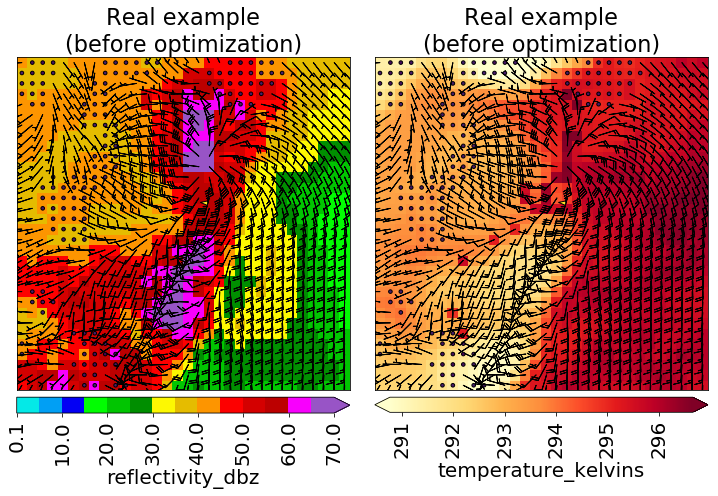

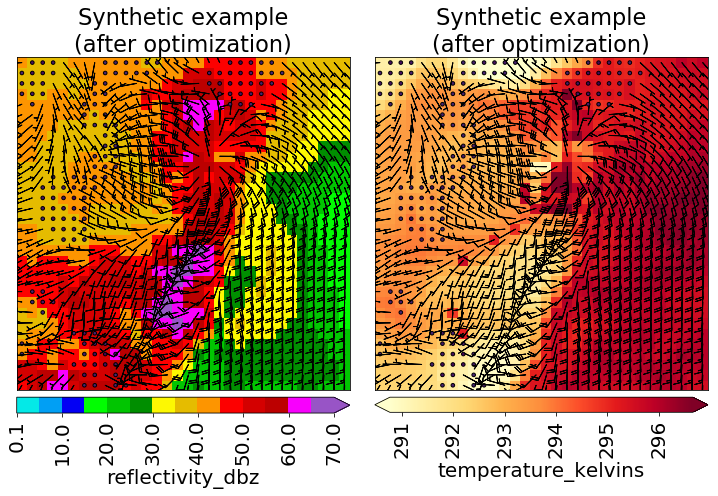

In [28]:
target_matrix_s01 = validation_image_dict[utils.TARGET_MATRIX_KEY]
example_index = numpy.unravel_index(
    numpy.argmax(target_matrix_s01), target_matrix_s01.shape
)[0]

orig_predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][example_index, ...]
    + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

orig_predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=orig_predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)
orig_predictor_matrix_norm = numpy.expand_dims(
    orig_predictor_matrix_norm, axis=0
)

new_predictor_matrix_norm = backwards_opt.optimize_example_for_class(
    model_object=cnn_model_object, input_matrix=orig_predictor_matrix_norm,
    target_class=0, num_iterations=1000, learning_rate=0.0001,
    l2_weight=0.
)[0][0, ...]

new_predictor_matrix_denorm = normalization.denormalize_images(
    predictor_matrix=new_predictor_matrix_norm,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)

temperature_index = predictor_names.index(utils.TEMPERATURE_NAME)
combined_temp_matrix_kelvins = numpy.concatenate((
    orig_predictor_matrix_denorm[..., temperature_index],
    new_predictor_matrix_denorm[..., temperature_index]
), axis=0)

min_temp_kelvins = numpy.percentile(combined_temp_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(combined_temp_matrix_kelvins, 99)

figure_object, axes_object_matrix = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=orig_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Real example\n(before optimization)')

figure_object, axes_object_matrix = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=new_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Synthetic example\n(after optimization)')

# Example 2 for backwards optimization

The previous example only decreased strong-rotation probability from 100% to 99.5%.  Let's turn the learning rate up to 10$^{-3}$.

Loss after 0 of 1000 iterations = 1.00e+00 ... activation = 1.00e+00
Loss after 100 of 1000 iterations = 9.91e-01 ... activation = 9.95e-01
Loss after 200 of 1000 iterations = 4.55e-01 ... activation = 6.75e-01
Loss after 300 of 1000 iterations = 4.26e-02 ... activation = 2.06e-01
Loss after 400 of 1000 iterations = 1.85e-02 ... activation = 1.36e-01
Loss after 500 of 1000 iterations = 3.97e-03 ... activation = 6.30e-02
Loss after 600 of 1000 iterations = 5.42e-04 ... activation = 2.33e-02
Loss after 700 of 1000 iterations = 2.09e-04 ... activation = 1.45e-02
Loss after 800 of 1000 iterations = 1.34e-04 ... activation = 1.16e-02
Loss after 900 of 1000 iterations = 9.86e-05 ... activation = 9.93e-03
Loss after 1000 iterations = 6.52e-05 ... activation = 8.07e-03


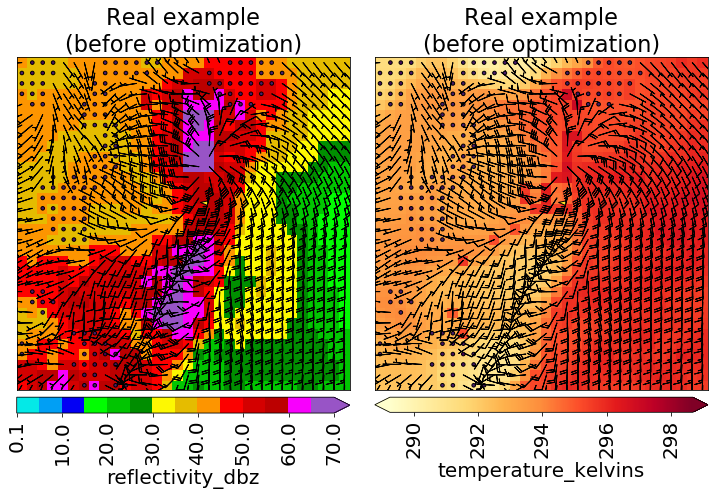

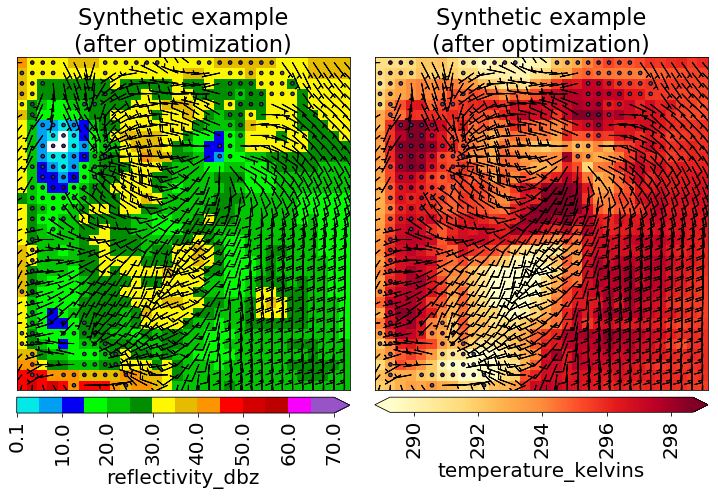

In [29]:
target_matrix_s01 = validation_image_dict[utils.TARGET_MATRIX_KEY]
example_index = numpy.unravel_index(
    numpy.argmax(target_matrix_s01), target_matrix_s01.shape
)[0]

orig_predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][example_index, ...]
    + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

orig_predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=orig_predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)
orig_predictor_matrix_norm = numpy.expand_dims(
    orig_predictor_matrix_norm, axis=0
)

new_predictor_matrix_norm = backwards_opt.optimize_example_for_class(
    model_object=cnn_model_object, input_matrix=orig_predictor_matrix_norm,
    target_class=0, num_iterations=1000, learning_rate=0.001,
    l2_weight=0.
)[0][0, ...]

new_predictor_matrix_denorm = normalization.denormalize_images(
    predictor_matrix=new_predictor_matrix_norm,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)

temperature_index = predictor_names.index(utils.TEMPERATURE_NAME)
combined_temp_matrix_kelvins = numpy.concatenate((
    orig_predictor_matrix_denorm[..., temperature_index],
    new_predictor_matrix_denorm[..., temperature_index]
), axis=0)

min_temp_kelvins = numpy.percentile(combined_temp_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(combined_temp_matrix_kelvins, 99)

figure_object, axes_object_matrix = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=orig_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Real example\n(before optimization)')

figure_object, axes_object_matrix = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=new_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Synthetic example\n(after optimization)')

# Example 3 for backwards optimization

The previous example completely obliterated the storm (and left an unrealistic-looking reflectivity hole in the rotation center).  Let's turn the learning rate down to 2 $\times$ 10$^{-4}$, increase the number of iterations to 1200, and use L$_2$ regularization with a weight of 2 $\times$ 10$^{-5}$.

Loss after 0 of 1200 iterations = 1.00e+00 ... activation = 1.00e+00
Loss after 100 of 1200 iterations = 1.00e+00 ... activation = 1.00e+00
Loss after 200 of 1200 iterations = 1.00e+00 ... activation = 1.00e+00
Loss after 300 of 1200 iterations = 9.99e-01 ... activation = 1.00e+00
Loss after 400 of 1200 iterations = 9.97e-01 ... activation = 9.98e-01
Loss after 500 of 1200 iterations = 9.91e-01 ... activation = 9.95e-01
Loss after 600 of 1200 iterations = 9.74e-01 ... activation = 9.86e-01
Loss after 700 of 1200 iterations = 9.31e-01 ... activation = 9.64e-01
Loss after 800 of 1200 iterations = 8.38e-01 ... activation = 9.14e-01
Loss after 900 of 1200 iterations = 6.74e-01 ... activation = 8.19e-01
Loss after 1000 of 1200 iterations = 4.56e-01 ... activation = 6.73e-01
Loss after 1100 of 1200 iterations = 2.65e-01 ... activation = 5.12e-01
Loss after 1200 iterations = 1.57e-01 ... activation = 3.91e-01


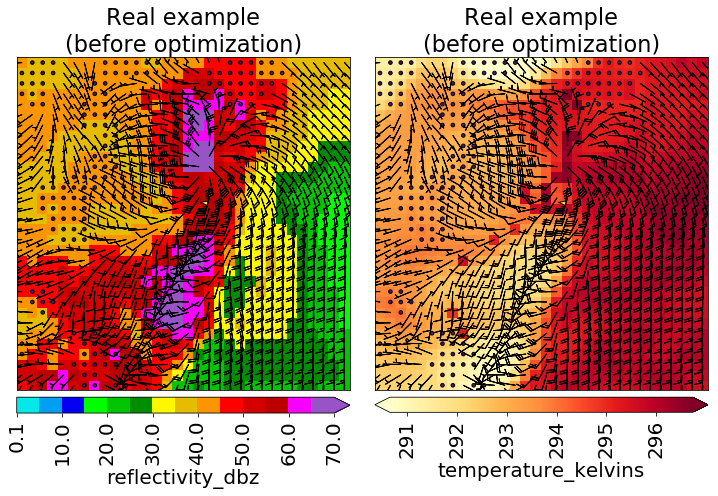

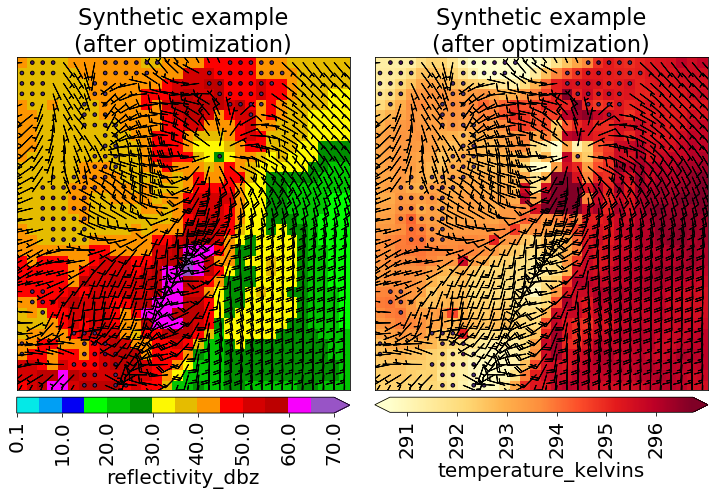

In [35]:
target_matrix_s01 = validation_image_dict[utils.TARGET_MATRIX_KEY]
example_index = numpy.unravel_index(
    numpy.argmax(target_matrix_s01), target_matrix_s01.shape
)[0]

orig_predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][example_index, ...]
    + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

orig_predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=orig_predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)
orig_predictor_matrix_norm = numpy.expand_dims(
    orig_predictor_matrix_norm, axis=0
)

new_predictor_matrix_norm = backwards_opt.optimize_example_for_class(
    model_object=cnn_model_object, input_matrix=orig_predictor_matrix_norm,
    target_class=0, num_iterations=1200, learning_rate=2e-4,
    l2_weight=2e-5
)[0][0, ...]

new_predictor_matrix_denorm = normalization.denormalize_images(
    predictor_matrix=new_predictor_matrix_norm,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)

temperature_index = predictor_names.index(utils.TEMPERATURE_NAME)
combined_temp_matrix_kelvins = numpy.concatenate((
    orig_predictor_matrix_denorm[..., temperature_index],
    new_predictor_matrix_denorm[..., temperature_index]
), axis=0)

min_temp_kelvins = numpy.percentile(combined_temp_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(combined_temp_matrix_kelvins, 99)

figure_object, axes_object_matrix = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=orig_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Real example\n(before optimization)')

figure_object, axes_object_matrix = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=new_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Synthetic example\n(after optimization)')

# Example 4 for backwards optimization

The next cell optimizes the first validation example to increase $p$:

 - 1000 iterations
 - Learning rate of 10$^{-3}$
 - No L_${2}$ penalty (completely unconstrained)

Loss after 0 of 1000 iterations = 9.86e-01 ... activation = 7.04e-03
Loss after 100 of 1000 iterations = 8.63e-01 ... activation = 7.09e-02
Loss after 200 of 1000 iterations = 2.86e-01 ... activation = 4.66e-01
Loss after 300 of 1000 iterations = 4.92e-03 ... activation = 9.30e-01
Loss after 400 of 1000 iterations = 2.10e-05 ... activation = 9.95e-01
Loss after 500 of 1000 iterations = 1.31e-06 ... activation = 9.99e-01
Loss after 600 of 1000 iterations = 6.53e-07 ... activation = 9.99e-01
Loss after 700 of 1000 iterations = 4.35e-07 ... activation = 9.99e-01
Loss after 800 of 1000 iterations = 3.26e-07 ... activation = 9.99e-01
Loss after 900 of 1000 iterations = 2.60e-07 ... activation = 9.99e-01
Loss after 1000 iterations = 2.17e-07 ... activation = 1.00e+00


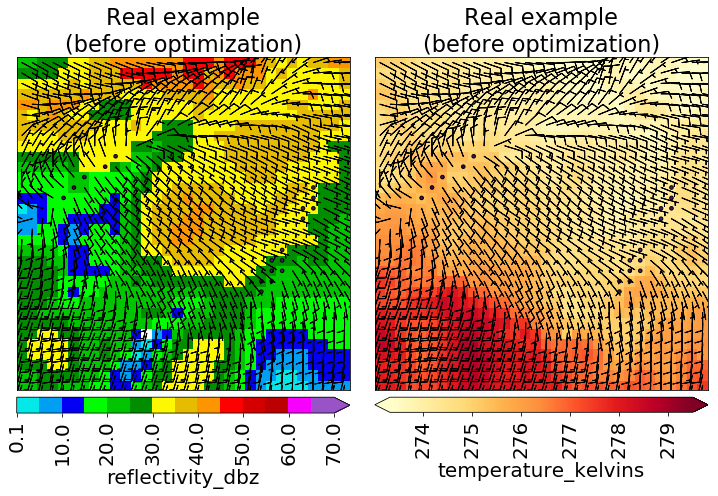

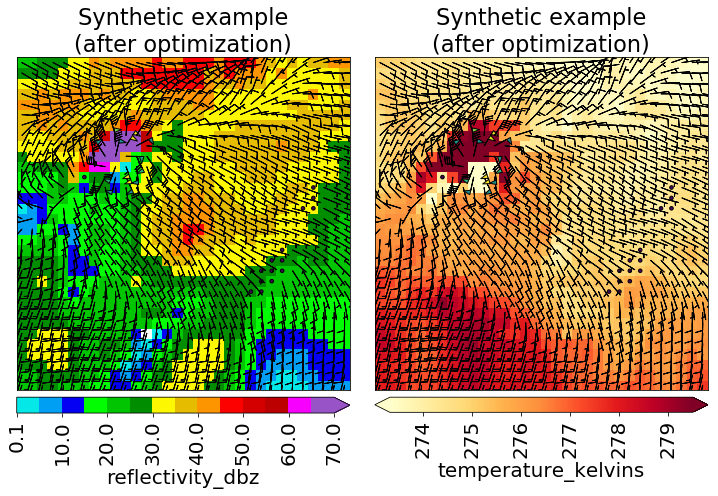

In [36]:
orig_predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][0, ...] + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

orig_predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=orig_predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)
orig_predictor_matrix_norm = numpy.expand_dims(
    orig_predictor_matrix_norm, axis=0
)

new_predictor_matrix_norm = backwards_opt.optimize_example_for_class(
    model_object=cnn_model_object, input_matrix=orig_predictor_matrix_norm,
    target_class=1, num_iterations=1000, learning_rate=0.001,
    l2_weight=0.
)[0][0, ...]

new_predictor_matrix_denorm = normalization.denormalize_images(
    predictor_matrix=new_predictor_matrix_norm,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)

temperature_index = predictor_names.index(utils.TEMPERATURE_NAME)
combined_temp_matrix_kelvins = numpy.concatenate((
    orig_predictor_matrix_denorm[..., temperature_index],
    new_predictor_matrix_denorm[..., temperature_index]
), axis=0)

min_temp_kelvins = numpy.percentile(combined_temp_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(combined_temp_matrix_kelvins, 99)

figure_object, axes_object_matrix = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=orig_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Real example\n(before optimization)')

figure_object, axes_object_matrix = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=new_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Synthetic example\n(after optimization)')

# Upconvnets

Before we can talk about novelty detection (the last interpretation method), we have to talk about upconvnets (upconvolutional networks).

Like I said earlier, an upconvnet projects from the feature space of a CNN back to the image space.  Now we can examine what that means.  The main components of a CNN are convolutional layers, pooling layers, and dense layers.  The convolutional and pooling layers make up the feature-detection part of the CNN, and the dense layers transform features into predictions.  In our case, the dense layers transform 6400 features into 1 prediction (probability of strong future rotation), as shown below.

<img src="cnn_architecture.jpg" alt="CNN architecture" width="1000" />

Between the conv/pooling layers and dense layers, there is a flattening layer, which turns the spatial feature maps into a 1-D vector.  In other words, it removes spatial structure from the feature maps, turning them into a list of scalar features.  An upconvnet transforms data from this feature space back to the input space.  In other words, an upconvnet reconstructs the input (or tries) from the 6400 scalar features created by a CNN.

# Example 1 for upconvnets

The next cell uses the pre-trained upconvnet to reconstruct the first validation example from feature space.

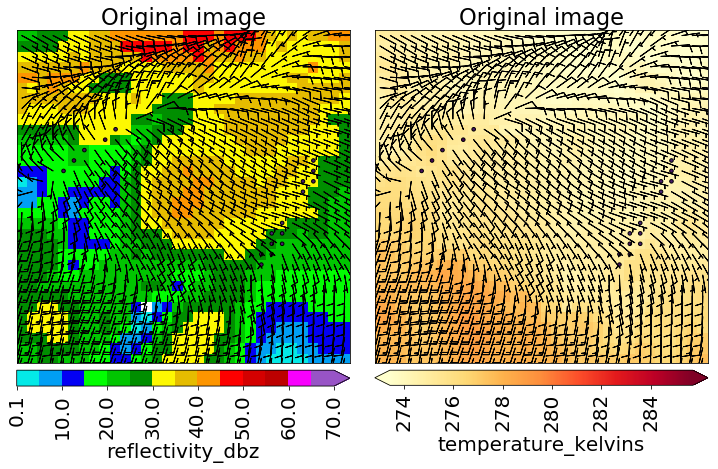

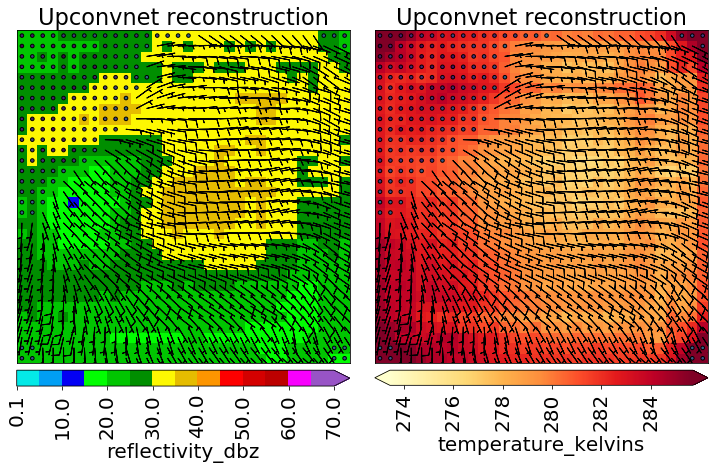

In [37]:
orig_predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][0, ...] + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

orig_predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=orig_predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)
orig_predictor_matrix_norm = numpy.expand_dims(
    orig_predictor_matrix_norm, axis=0
)

recon_predictor_matrix_norm = cnn.apply_upconvnet(
    cnn_model_object=cnn_model_object,
    predictor_matrix=orig_predictor_matrix_norm,
    cnn_feature_layer_name=cnn.get_flattening_layer(cnn_model_object),
    upconvnet_model_object=upconvnet_model_object,
    verbose=False
)

recon_predictor_matrix_denorm = normalization.denormalize_images(
    predictor_matrix=recon_predictor_matrix_norm,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)[0, ...]

temperature_index = predictor_names.index(utils.TEMPERATURE_NAME)
concat_temp_matrix_kelvins = numpy.concatenate((
    orig_predictor_matrix_denorm[..., temperature_index],
    recon_predictor_matrix_denorm[..., temperature_index]
), axis=0)

min_temp_kelvins = numpy.percentile(concat_temp_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(concat_temp_matrix_kelvins, 99)

_, axes_object_matrix = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=orig_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Original image')

_, axes_object_matrix = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=recon_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Upconvnet reconstruction')

# Example 2 for upconvnets

The next cell uses the pre-trained upconvnet to reconstruct the most extreme validation example.

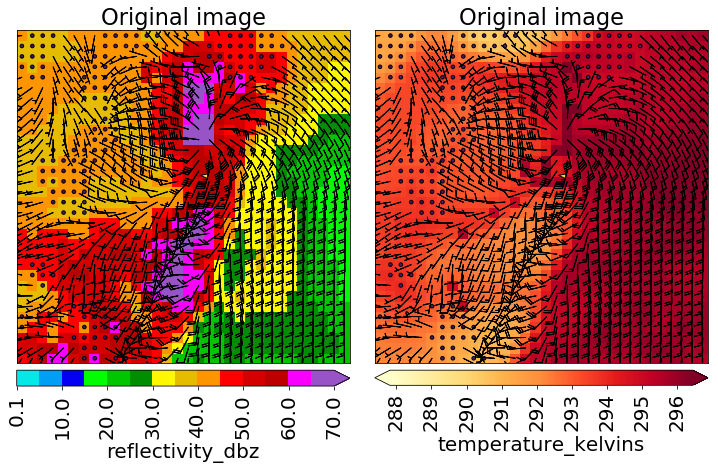

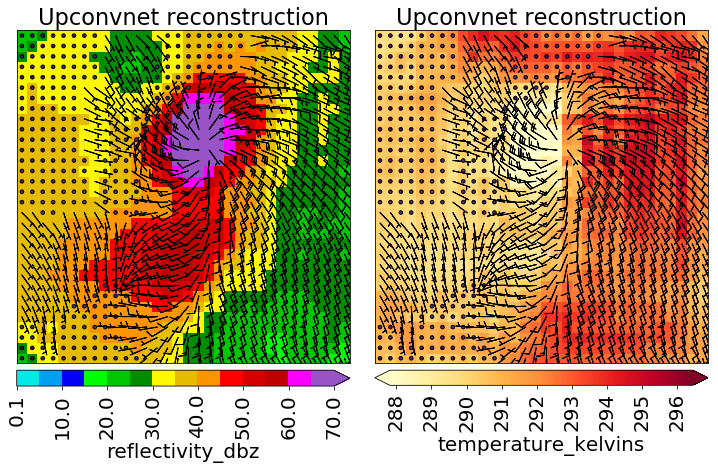

In [38]:
target_matrix_s01 = validation_image_dict[utils.TARGET_MATRIX_KEY]
example_index = numpy.unravel_index(
    numpy.argmax(target_matrix_s01), target_matrix_s01.shape
)[0]

orig_predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][example_index, ...]
    + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

orig_predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=orig_predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)
orig_predictor_matrix_norm = numpy.expand_dims(
    orig_predictor_matrix_norm, axis=0
)

recon_predictor_matrix_norm = cnn.apply_upconvnet(
    cnn_model_object=cnn_model_object,
    predictor_matrix=orig_predictor_matrix_norm,
    cnn_feature_layer_name=cnn.get_flattening_layer(cnn_model_object),
    upconvnet_model_object=upconvnet_model_object,
    verbose=False
)

recon_predictor_matrix_denorm = normalization.denormalize_images(
    predictor_matrix=recon_predictor_matrix_norm,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)[0, ...]

temperature_index = predictor_names.index(utils.TEMPERATURE_NAME)
concat_temp_matrix_kelvins = numpy.concatenate((
    orig_predictor_matrix_denorm[..., temperature_index],
    recon_predictor_matrix_denorm[..., temperature_index]
), axis=0)

min_temp_kelvins = numpy.percentile(concat_temp_matrix_kelvins, 1)
max_temp_kelvins = numpy.percentile(concat_temp_matrix_kelvins, 99)

_, axes_object_matrix = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=orig_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Original image')

_, axes_object_matrix = plotting.plot_many_predictors_with_barbs(
    predictor_matrix=recon_predictor_matrix_denorm,
    predictor_names=predictor_names,
    min_colour_temp_kelvins=min_temp_kelvins,
    max_colour_temp_kelvins=max_temp_kelvins
)

for i in range(axes_object_matrix.shape[0]):
    for j in range(axes_object_matrix.shape[1]):
        axes_object_matrix[i, j].set_title('Upconvnet reconstruction')

# Interpretation method 5: Novelty detection

Novelty detection (Wagstaff and Lee 2018) works with two sets of examples, the baseline set and the trial set.  Novelty detection quantifies the novelty of each trial example with respect to the baseline set.  Also, for each trial example $\mathbf{X}$, novelty detection can plot which parts of $\mathbf{X}$ are most novel.

Novelty detection has been around for a while, but it was difficult to apply to image data.  You can apply novelty detection to the raw pixel values (*i.e.*, flatten each 32-by-32-by-4 tensor into 4096 scalar values and run novelty detection on the 4096 scalar values), but the results usually contain a lot of high-frequency noise.  You can use SVD (singular-value decomposition) to convert the image to principal components, find the novelty in principal-component space, and then project from principal-component space back to image space &ndash; but the projection back to image space is often very lossy.

Wagstaff and Lee proposed doing the following for each trial example:

 1. Convert the image to a feature vector (using the CNN).
 2. Convert the feature vector back to image space (using the upconvnet).
 3. Convert the feature vector to principal components (using an SVD model trained only on the baseline set).
 4. Convert the principal components back to a feature vector.
 5. Convert the PC-reconstructed feature vector back to image space (using the upconvnet).

The product of step 2 is the upconvnet reconstruction; the product of step 5 is the upconvnet/PC reconstruction; and the difference (first minus second reconstruction) is the novelty map in image space.  It is the part of the trial image that is novel, or unexpected, with respect to the baseline images.

# Example of novelty detection

The next cell runs novelty detection with the following settings:

 - Baseline set = 100 negative validation examples (weak future rotation)
 - Trial set = 100 validation examples with strongest future rotation

This cell finds the 4 most novel trial examples.

In [13]:
target_matrix_s_01 = validation_image_dict[utils.TARGET_MATRIX_KEY]
max_target_values_s01 = numpy.max(target_matrix_s_01, axis=(1, 2))

trial_indices = numpy.argsort(-1 * max_target_values_s01)[:100]
trial_indices = trial_indices[trial_indices >= 100]
baseline_indices = numpy.linspace(0, 100, num=100, dtype=int)

baseline_predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][baseline_indices, ...]
    + 0.
)
trial_predictor_matrix_denorm = (
    validation_image_dict[utils.PREDICTOR_MATRIX_KEY][trial_indices, ...]
    + 0.
)
predictor_names = validation_image_dict[utils.PREDICTOR_NAMES_KEY]

baseline_predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=baseline_predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)
trial_predictor_matrix_norm, _ = normalization.normalize_images(
    predictor_matrix=trial_predictor_matrix_denorm + 0.,
    predictor_names=predictor_names,
    normalization_dict=normalization_dict
)

novelty_dict = novelty_detection.run_novelty_detection(
    baseline_predictor_matrix_norm=baseline_predictor_matrix_norm,
    trial_predictor_matrix_norm=trial_predictor_matrix_norm,
    cnn_model_object=cnn_model_object,
    cnn_feature_layer_name=cnn.get_flattening_layer(cnn_model_object),
    upconvnet_model_object=upconvnet_model_object,
    num_novel_examples=4, multipass=False
)

novelty_dict[novelty_detection.NOVEL_MATRIX_KEY] = (
    normalization.denormalize_images(
        predictor_matrix=novelty_dict[novelty_detection.NOVEL_MATRIX_KEY],
        predictor_names=predictor_names,
        normalization_dict=normalization_dict
    )
)

novelty_dict[novelty_detection.NOVEL_MATRIX_UPCONV_KEY] = (
    normalization.denormalize_images(
        predictor_matrix=
        novelty_dict[novelty_detection.NOVEL_MATRIX_UPCONV_KEY],
        predictor_names=predictor_names,
        normalization_dict=normalization_dict
    )
)

novelty_dict[novelty_detection.NOVEL_MATRIX_UPCONV_SVD_KEY] = (
    normalization.denormalize_images(
        predictor_matrix=
        novelty_dict[novelty_detection.NOVEL_MATRIX_UPCONV_SVD_KEY],
        predictor_names=predictor_names,
        normalization_dict=normalization_dict
    )
)

Applying model to examples 0-99 of 100...
Have applied model to all 100 examples!


Applying model to examples 0-99 of 100...
Have applied model to all 100 examples!


Finding 1th-most novel trial example...
Number of modes required to explain 97.500000% of variance: 14
0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
Finding 2th-most novel trial example...
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
Finding 3th-most novel trial example...
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27

# Plot most novel example

The next cell plots the most novel trial example, according to novelty detection (also the strongest trial example).

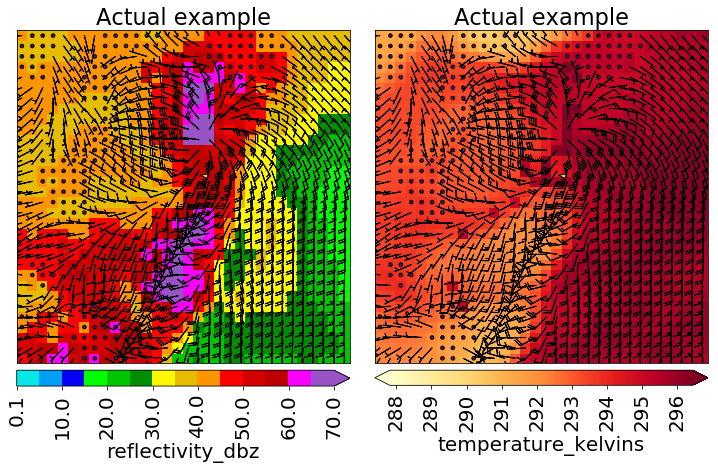

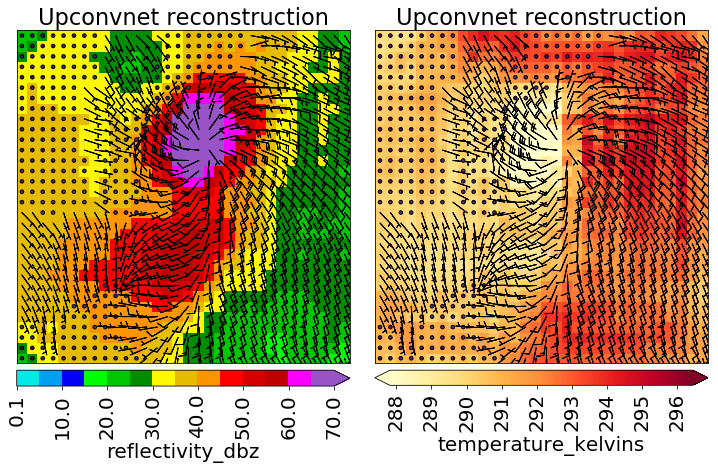

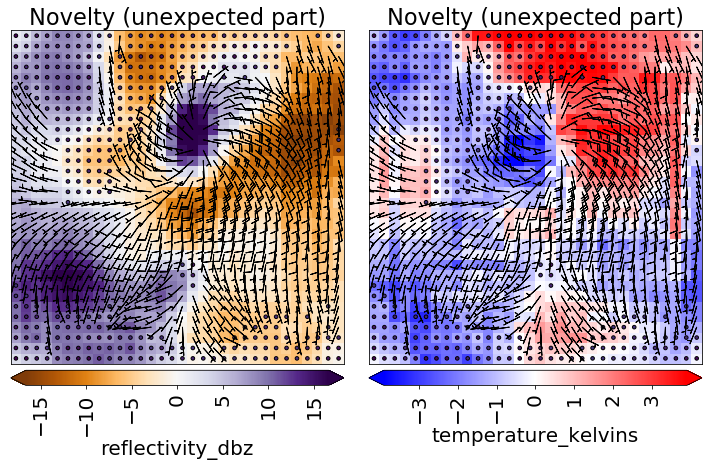

In [14]:
novelty_detection.plot_results(
    novelty_dict_denorm=novelty_dict, plot_index=0,
    predictor_names=validation_image_dict[utils.PREDICTOR_NAMES_KEY]
)

# Plot 2$^{\textrm{nd}}$-most novel example

The next cell plots the second-most novel trial example.

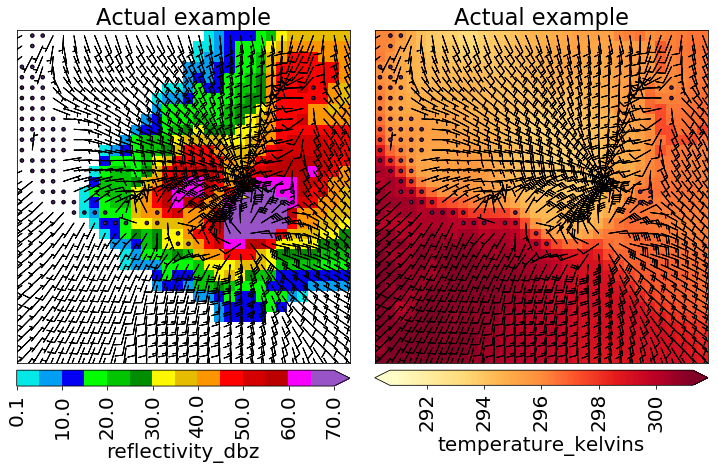

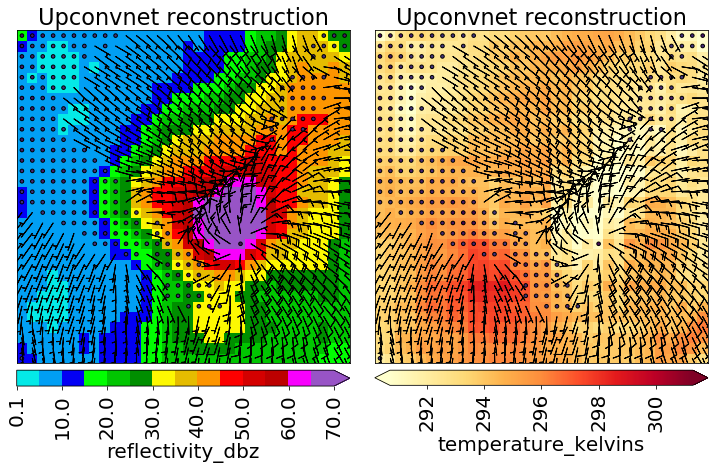

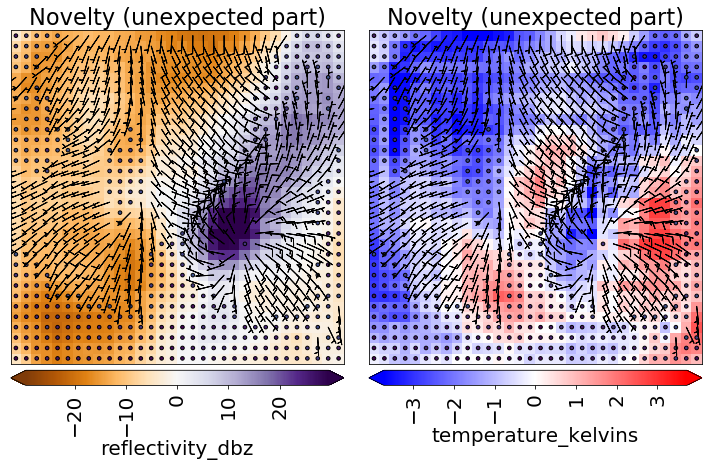

In [15]:
novelty_detection.plot_results(
    novelty_dict_denorm=novelty_dict, plot_index=1,
    predictor_names=validation_image_dict[utils.PREDICTOR_NAMES_KEY]
)

# Plot 3$^{\textrm{rd}}$-most novel example

The next cell plots the third-most novel trial example.

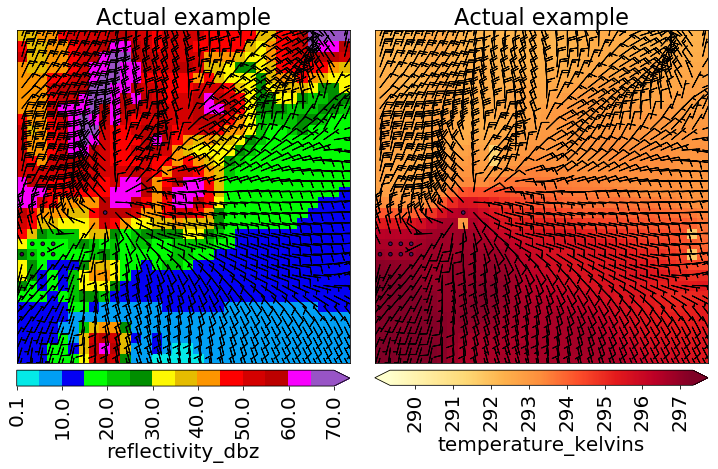

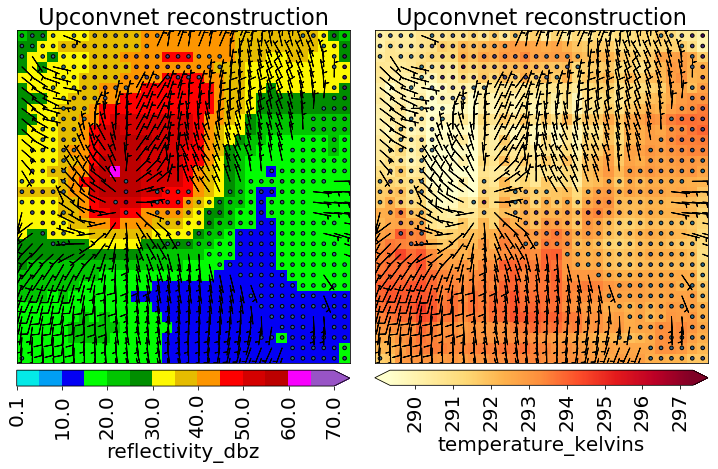

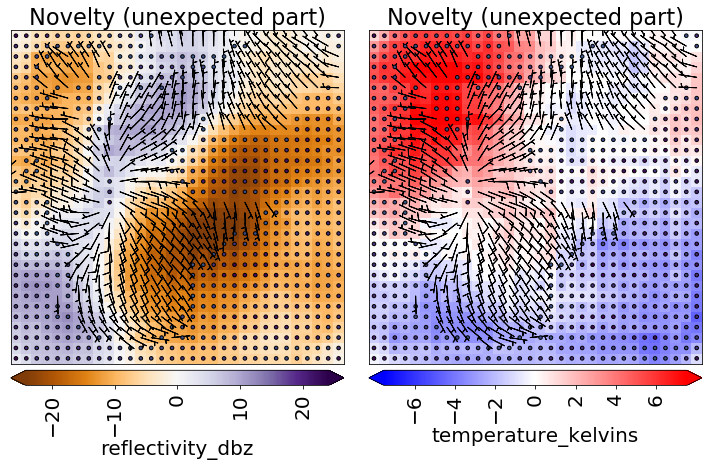

In [16]:
novelty_detection.plot_results(
    novelty_dict_denorm=novelty_dict, plot_index=2,
    predictor_names=validation_image_dict[utils.PREDICTOR_NAMES_KEY]
)

# Plot 4$^{\textrm{th}}$-most novel example

The next cell plots the fourth-most novel trial example.

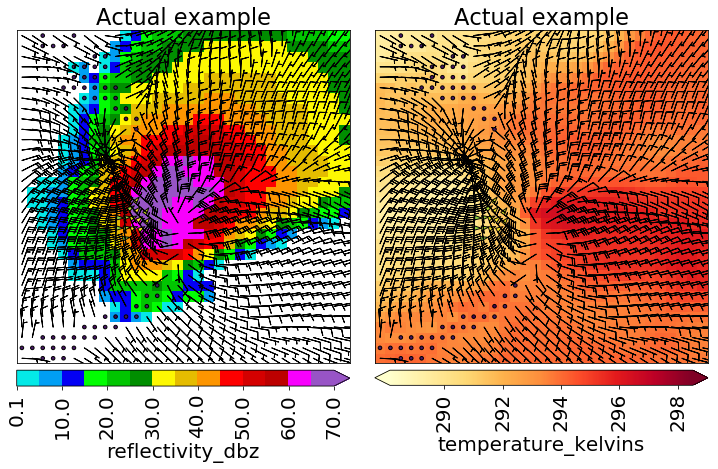

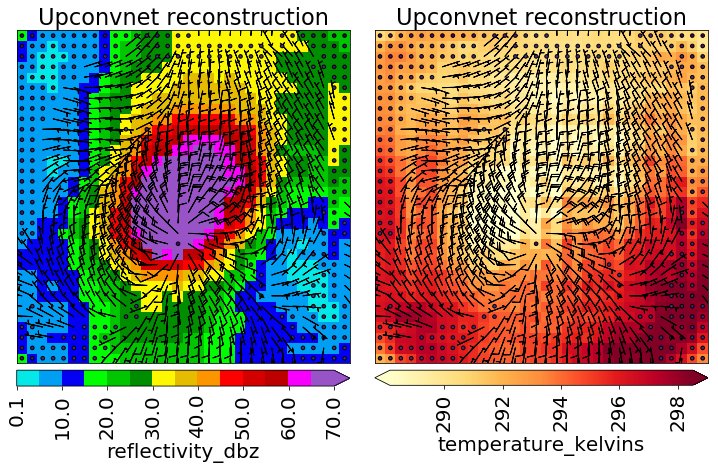

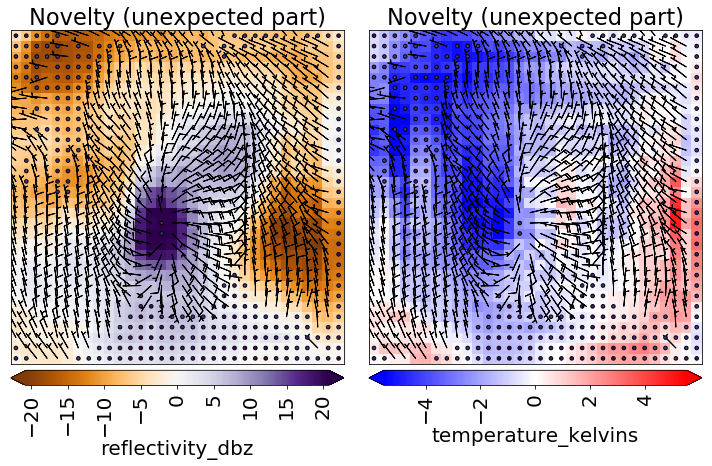

In [17]:
novelty_detection.plot_results(
    novelty_dict_denorm=novelty_dict, plot_index=3,
    predictor_names=validation_image_dict[utils.PREDICTOR_NAMES_KEY]
)